# env

In [1]:
%matplotlib notebook
# %matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import time
import importlib as imp
import asyncio
import functools
import os
import nest_asyncio
nest_asyncio.apply()
from scipy.linalg import sqrtm
from scipy.optimize import curve_fit
from scipy import interpolate as intp

from QOS.Tools.utils import qulab_mplstyle as qsty
plt.style.use(qsty)

from QOS.Manager import openDriver, openUManager, openServer
from QOS.Tools import Fit
from QOS.Gate.wavedata import A, vIQmixer
from QOS.Chip.utils import cfgload,cfgsave,cfgContext

from QOS.Register import ConsManager,constrain_init, constrain_meas, check_missing_keys

import QOS.Gate.wavedata as WD
from QOS.Frame import repeat_measure, set_once, get_once, optimize_experiment
from QOS.Tools.utils import get_chi
from QOS.Collector import redisRecord, gen_fig
from Meas import ADC2, NA2, SEQ, SetClass, GetClass, SA
# import Meas.SA._SA as SA
# import Meas.SA as SA
import logging
log = logging.getLogger('QOS.Chip')
log.setLevel(logging.ERROR)
from QOS.Demod.demod_func import getClassifyParameters,getThresholdParameters,getReadoutM
from QOS.Demod.method_original import getCount_original,getClassifyParameters
from QOS.Demod.method_kmeans import plot_kmeans_1q,getParameters_kmeans_1q,getParameters_kmeans_multiq
from Meas.Readout_tools import readoutM_gateMapList
from QOS.Demod.iq_cloud import getThresholdInfo,plotDistribution,classify
import json
import pandas as pd
from pptx import Presentation
from pptx.util import Inches, Cm, Pt

ERROR:  Could not find module 'SD1core' (or one of its dependencies). Try using the full path with constructor syntax.
keysightSD1 failed to load 'SD1core' and PASS!


In [2]:
from meas.executor.na import NA_Executor
# from meas.executor.na import Repeat_Executor as NA_Repeat_Executor
from meas.executor.ns import ADC_Executor,Repeat_Executor
import meas.experiment_na as na
import meas.experiment as adc
import meas.experiment_opt as opt

In [3]:
from QOS.WorkSpace import start, QOS_WORKSPACE
# from QOS.Driver.drivers.JPA import JPACtl
import workspace
import imp
imp.reload(workspace)
from nsqdriver.NS_MCI import SHARED_DEVICE_MEM
# from QOS.Driver.drivers.
SHARED_DEVICE_MEM.clear_ip()

await start(workspace.workspace)
um=QOS_WORKSPACE['um']
root=QOS_WORKSPACE['root']
await um.get_ins_info()

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_20912\981320862.py:4: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp


open SinolinkPSG@10.100.16.3
open SinolinkPSG@10.100.16.4
open SinolinkPSG@10.100.16.5
open QC_DA_SZ@QF10LC80067


C:\Python39\lib\site-packages\scapy\layers\ipsec.py:471: CryptographyDeprecationWarning: Blowfish has been deprecated
  cipher=algorithms.Blowfish,
C:\Python39\lib\site-packages\scapy\layers\ipsec.py:485: CryptographyDeprecationWarning: CAST5 has been deprecated
  cipher=algorithms.CAST5,
b'10.0.200.132' connect sucessful.
DAC QF10LC80067 set monitor ip to: 10.0.200.13
DAC QF10LC80067 set monitor ip to: 10.0.200.13


Use npcap
Log file path: C:\ProgramData\QuLab\QC_Tek\log\test\test.log
open QC_AD_SZ@QE10M470001
Log file path: ./log/QE10M470001\QE10M470001.log
('sever_mac:', 'D8:BB:C1:B9:DA:40')
D8:BB:C1:B9:DA:40
INDEX  IFACE                                         IPv4             IPv6                       MAC
6      Intel(R) Ethernet Connection (7) I219-LM      10.0.200.13      fe80::aeef:cf87:14e6:545b  d8:bb:c1:b9:da:40
1      Software Loopback Interface 1                 127.0.0.1        ::1                        00:00:00:00:00:00
18     Microsoft Wi-Fi Direct Virtual Adapter #2     169.254.135.146  fe80::7dba:9731:6e92:1278  24:69:8e:5d:17:f8
11     Microsoft Wi-Fi Direct Virtual Adapter        169.254.71.212   fe80::e2f9:54dc:608b:6e16  26:69:8e:5d:17:f8
13     Realtek 8811CU Wireless LAN 802.11ac USB NIC  192.168.55.40    fe80::f05c:dbc9:d9ed:bbe4  24:69:8e:5d:17:f8
-1     NdisWan Adapter                               None             None                       00:00:00:00:00:00
-3     Nd

[2024-11-05 09:19:17,375][QE10M470001][INFO] Set host mac of QE10M470001 to d8:bb:c1:b9:da:40
[2024-11-05 09:19:17,398][QE10M470001][INFO] Set host mac of QE10M470001 to d8:bb:c1:b9:da:40
b'10.0.200.133' connect sucessful.
DAC QF10LC80013 set monitor ip to: 10.0.200.13
DAC QF10LC80013 set monitor ip to: 10.0.200.13
b'10.0.200.135' connect sucessful.
DAC QF10LC80066 set monitor ip to: 10.0.200.13
DAC QF10LC80066 set monitor ip to: 10.0.200.13
b'10.0.200.127' connect sucessful.
DAC QF10LC80063 set monitor ip to: 10.0.200.13
DAC QF10LC80063 set monitor ip to: 10.0.200.13
b'10.0.200.126' connect sucessful.
DAC QF10L840003 set monitor ip to: 10.0.200.13
DAC QF10L840003 set monitor ip to: 10.0.200.13


open QC_DA_SZ@QF10LC80013
open QC_DA_SZ@QF10LC80066
open QC_DA_SZ@QF10LC80063
open QC_DA_SZ@QF10L840003


{'MW3': ('SLFS0218H', '10.100.16.3'),
 'MW4': ('SLFS0218H', '10.100.16.4'),
 'MW5': ('SLFS0218H', '10.100.16.5'),
 'QC1_A_DA': ('QC_DA', 'QF10LC80067'),
 'QC1_A_AD': ('QC_AD', 'QE10M470001'),
 'QC1_C_Left': ('QC_DA', 'QF10LC80013'),
 'QC1_E_Right': ('QC_DA', 'QF10LC80066'),
 'QC3_D_Right': ('QC_DA', 'QF10LC80063'),
 'QC3_D_Left': ('QC_DA', 'QF10L840003')}

In [4]:
# 初始化耐数设备

probe_srate = 8e9  # 板卡1 DA采样率
xy_srate = 6e9     # 板卡2 DA采样率
 
qsync=um.ins_pool['NS_SYNC']
qmac=um.ins_pool['NS_DEV']
qmac.setValue('ReInit', {'DArate_1': probe_srate, 'DArate_5': xy_srate, 'CaptureMode': 0}) 
# CaptureMode为1 取全量原始数据， 为0 取解模结果，两个配置二选一

# qmac.setValue()
qsync.setValue('RefClock','in')
qsync.sync_system()
time.sleep(1)

System synchronization succeeded


In [5]:
# 执行采集卡任务时运行

shot = 1024
qsync.BurstMode_init(count=shot, delay=None, period=200e-6)
qmac.setValue('shots',shot,ch=1)
qmac.set("KeepAmp", 1)

In [6]:
def reset_offset():
    for ch in range(13,21):
        um.ins_pool['NS_DEV'].setValue('Offset',0,ch=ch)
    um.updatecfg()
    qsync.set('GenerateTrig')
reset_offset()

In [7]:
from QOS.Chip.utils import cfgload,cfgsave,cfgContext
from QOS.Register import ConsManager,constrain_init, constrain_meas, check_missing_keys

cfg_file = 'dyn_config_TGQB_20bitv8_2024_18_NS_20241023'
filedicit_file = 'filedict_TGQB_20bitv8_2024_18_NS_20241023'

from meas.ini import set_ini,ini_dict
set_ini(cfg_file=cfg_file, filedicit_file=filedicit_file)

with cfgContext(cfg_file, constrain_init) as config:
    pass

In [8]:
from QOS.Gate.GateEditor_cache import GateEditor
from QOS.Gate.utils.compiler_utils import aliasMap_decompos
GateEditor.use_compiler=True
GateEditor.aliasMap=aliasMap_decompos

## guodun

In [1]:
%matplotlib notebook
# %matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import time
import math
import importlib as imp
import asyncio
import functools
import os
import nest_asyncio
nest_asyncio.apply()
from scipy.linalg import sqrtm
from scipy.optimize import curve_fit
from scipy import interpolate as intp

from QOS.Tools.utils import qulab_mplstyle as qsty
plt.style.use(qsty)

from QOS.Manager import openDriver, openUManager, openServer
from QOS.Tools import Fit
from QOS.Gate.wavedata import A, vIQmixer
from QOS.Chip.utils import cfgload,cfgsave,cfgContext

from QOS.Register import ConsManager,constrain_init, constrain_meas, check_missing_keys
import QOS.Gate.wavedata as WD
from QOS.Frame import repeat_measure, set_once, get_once, optimize_experiment
from QOS.Tools.utils import get_chi
from QOS.Collector import redisRecord, gen_fig
from Meas import ADC2, NA2, SEQ, SetClass, GetClass, SA
# import Meas.SA._SA as SA
# import Meas.SA as SA
import logging
log = logging.getLogger('QOS.Chip')
log.setLevel(logging.ERROR)
from QOS.Demod.demod_func import getClassifyParameters,getThresholdParameters,getReadoutM
from QOS.Demod.method_original import getCount_original,getClassifyParameters
from QOS.Demod.method_kmeans import plot_kmeans_1q,getParameters_kmeans_1q,getParameters_kmeans_multiq
from Meas.Readout_tools import readoutM_gateMapList
from QOS.Demod.iq_cloud import getThresholdInfo,plotDistribution,classify

ERROR:  Could not find module 'SD1core' (or one of its dependencies). Try using the full path with constructor syntax.
keysightSD1 failed to load 'SD1core' and PASS!


In [2]:
from meas.executor.na import NA_Executor
# from meas.executor.na import Repeat_Executor as NA_Repeat_Executor
from meas.executor.qc import ADC_Executor,Repeat_Executor
import meas.experiment_na as na
import meas.experiment as adc
import meas.experiment_opt as opt

In [3]:
from QOS.WorkSpace import start, QOS_WORKSPACE
# from QOS.Driver.drivers.JPA import JPACtl
import workspace
import imp
imp.reload(workspace)
from nsqdriver.NS_MCI import SHARED_DEVICE_MEM
# from QOS.Driver.drivers.
SHARED_DEVICE_MEM.clear_ip()

await start(workspace.workspace)
um=QOS_WORKSPACE['um']
root=QOS_WORKSPACE['root']
await um.get_ins_info()

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_6096\981320862.py:4: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp


open SinolinkPSG@10.100.16.3
open SinolinkPSG@10.100.16.4
open SinolinkPSG@10.100.16.5
open QC_DA_SZ@QF10LC80067


C:\Python39\lib\site-packages\scapy\layers\ipsec.py:471: CryptographyDeprecationWarning: Blowfish has been deprecated
  cipher=algorithms.Blowfish,
C:\Python39\lib\site-packages\scapy\layers\ipsec.py:485: CryptographyDeprecationWarning: CAST5 has been deprecated
  cipher=algorithms.CAST5,
b'10.0.200.132' connect sucessful.
DAC QF10LC80067 set monitor ip to: 10.0.200.13
DAC QF10LC80067 set monitor ip to: 10.0.200.13


Use npcap
Log file path: C:\ProgramData\QuLab\QC_Tek\log\test\test.log
open QC_AD_SZ@QE10M470001
Log file path: ./log/QE10M470001\QE10M470001.log
('sever_mac:', 'D8:BB:C1:B9:DA:40')
D8:BB:C1:B9:DA:40
INDEX  IFACE                                         IPv4             IPv6                       MAC
6      Intel(R) Ethernet Connection (7) I219-LM      10.0.200.13      fe80::aeef:cf87:14e6:545b  d8:bb:c1:b9:da:40
1      Software Loopback Interface 1                 127.0.0.1        ::1                        00:00:00:00:00:00
18     Microsoft Wi-Fi Direct Virtual Adapter #2     169.254.135.146  fe80::7dba:9731:6e92:1278  24:69:8e:5d:17:f8
11     Microsoft Wi-Fi Direct Virtual Adapter        169.254.71.212   fe80::e2f9:54dc:608b:6e16  26:69:8e:5d:17:f8
13     Realtek 8811CU Wireless LAN 802.11ac USB NIC  192.168.55.40    fe80::f05c:dbc9:d9ed:bbe4  24:69:8e:5d:17:f8
-1     NdisWan Adapter                               None             None                       00:00:00:00:00:00
-3     Nd

[2024-11-05 11:54:43,863][QE10M470001][INFO] Set host mac of QE10M470001 to d8:bb:c1:b9:da:40
[2024-11-05 11:54:43,966][QE10M470001][INFO] Set host mac of QE10M470001 to d8:bb:c1:b9:da:40
b'10.0.200.133' connect sucessful.
DAC QF10LC80013 set monitor ip to: 10.0.200.13
DAC QF10LC80013 set monitor ip to: 10.0.200.13
b'10.0.200.135' connect sucessful.
DAC QF10LC80066 set monitor ip to: 10.0.200.13
DAC QF10LC80066 set monitor ip to: 10.0.200.13
b'10.0.200.127' connect sucessful.
DAC QF10LC80063 set monitor ip to: 10.0.200.13


open QC_DA_SZ@QF10LC80013
open QC_DA_SZ@QF10LC80066
open QC_DA_SZ@QF10LC80063


DAC QF10LC80063 set monitor ip to: 10.0.200.13
b'10.0.200.126' connect sucessful.
DAC QF10L840003 set monitor ip to: 10.0.200.13
DAC QF10L840003 set monitor ip to: 10.0.200.13


open QC_DA_SZ@QF10L840003


{'MW3': ('SLFS0218H', '10.100.16.3'),
 'MW4': ('SLFS0218H', '10.100.16.4'),
 'MW5': ('SLFS0218H', '10.100.16.5'),
 'QC1_A_DA': ('QC_DA', 'QF10LC80067'),
 'QC1_A_AD': ('QC_AD', 'QE10M470001'),
 'QC1_C_Left': ('QC_DA', 'QF10LC80013'),
 'QC1_E_Right': ('QC_DA', 'QF10LC80066'),
 'QC3_D_Right': ('QC_DA', 'QF10LC80063'),
 'QC3_D_Left': ('QC_DA', 'QF10L840003')}

In [4]:
def reset_offset():
    um.updatecfg()
    for ins_name in [
            'QC1_A_DA',
            'QC1_C_Left',
            'QC1_E_Right',
            'QC3_D_Left',
            'QC3_D_Right',
    ]:
        for ch in range(1, 5):
            um.ins_pool[ins_name].setValue('Offset', 0, ch=ch)

reset_offset()

In [5]:
from QOS.Chip.utils import cfgload,cfgsave,cfgContext
from QOS.Register import ConsManager,constrain_init, constrain_meas, check_missing_keys

cfg_file = 'dyn_config_TGQB_20bitv5_2024_18_20241101_QC_coupler'
filedicit_file = 'filedict_TGQB_20bitv5_2024_18_20241101_QC'

from meas.ini import set_ini,ini_dict
set_ini(cfg_file=cfg_file, filedicit_file=filedicit_file)

with cfgContext(cfg_file, constrain_init) as config:
    pass

In [6]:
from QOS.Gate.GateEditor_cache import GateEditor
from QOS.Gate.utils.compiler_utils import aliasMap_decompos
GateEditor.use_compiler=True
GateEditor.aliasMap=aliasMap_decompos

# 动态测试 Pi_length

In [9]:
from QOS.Register import constrain_init, constrain_meas
from meas.utils import set_measQ, update_default
def Dynamic_pi_length(measQ, timeList, tags=None, setting=None, constrains=None):
    name = 'Dynamic_pi_length'
    config = set_measQ(measQ)
    chip_name = config['Chip']['name']
    currentProb = config['ADC_Meas']['current_PROB']
    line = config[measQ]['inst']['ADC_PROB']

    setting_default = {
        'readout_mode': 'IQ',
        'preprocess_mode': 'original',
        # 'shots_avg': True,
        'shots_avg': False,
        # 'singleShot_mode': None,
        'singleShot_mode': 'svm',
        'populationConvert_mode': 'matrixCali',
        'shotsdata_level': 2,


        'gateMap': {
            f'{measQ}': ['U_0_90'],
        },
    }

    sweep_config = {
        'name': f'Test_dyna{measQ}',
        'time': f'cfg.{measQ}.gate.U_gates.pi_len',
        'unit': {
            'time': 's',
        }
    }
    sweep_setting = {
        'time': timeList,
    }
    _cons = ((f'cfg.{measQ}.para.drivFreq', f'cfg.{measQ}.para.drivLoFreq'), (lambda v1, v2: v1-v2),
             f'cfg.{measQ}.para.drivCarryFreq')
    constrains_default = [*constrain_meas(config, 'cfg.'), _cons]
    tags_default = [f'*{measQ}@{line}@{chip_name}']

    tags = update_default(tags_default, tags)
    setting = update_default(setting_default, setting)
    constrains = update_default(constrains_default, constrains)

    experiment = dict(name=name,
                      measQ=measQ,
                      config=config,
                      setting=setting,
                      tags=tags,
                      sweep_config=sweep_config,
                      sweep_setting=sweep_setting,
                      constrains=constrains)
    return experiment

'D:\\Data\\QuLabData_F2\\2024\\1105\\S21Q16_20241105092311.qdat'


<IPython.core.display.Javascript object>


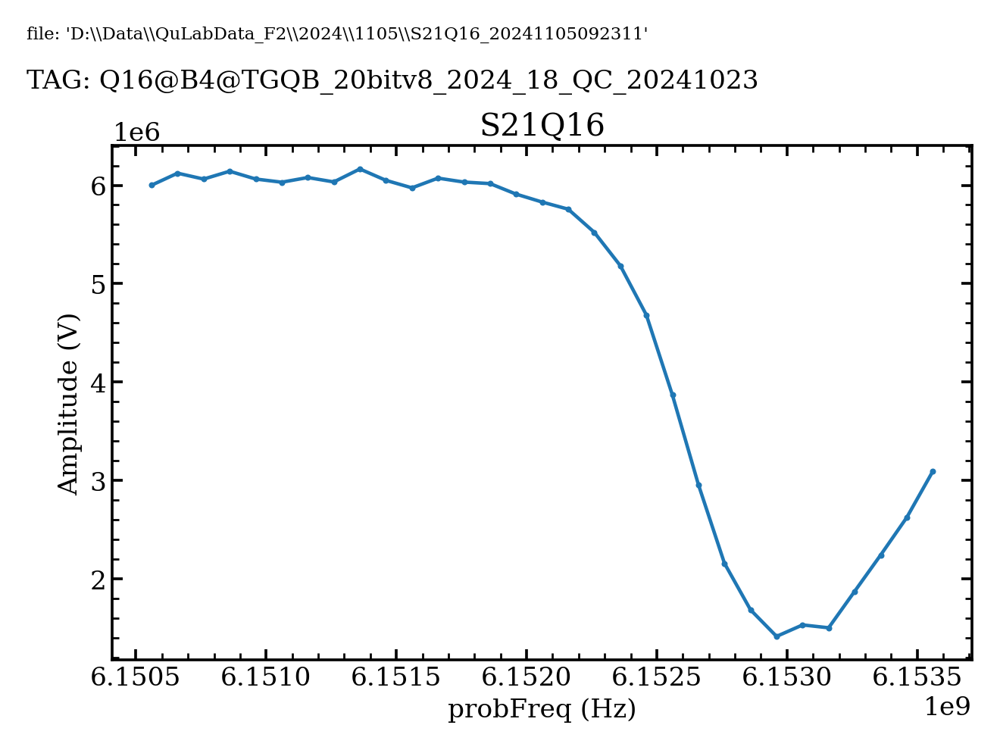

'D:\\Data\\QuLabData_F2\\2024\\1105\\S21Q16_20241105092311.jpg'


In [7]:
measQ='Q16' 
span=3e6
point=31
# reset_offset()
# JPA Setting
# pump_freq = 13.425e9 # unit Hz
# flux = -0.14  # unit dBm
# pump_power = -3  # unit dBm
# JPA = JPACtl(um, cfg_file)
# JPA.JPA_Ctl(measQ, flux, pump_freq, pump_power)
# reset_offset()

# reset_offset()
# with cfgContext(cfg_file, constrain_init) as config:
#     config['Chip']['All_Qubits']=[measQ, "JPA"]
experiment = adc.S21.S21_dds(measQ, span, point, tags=None, setting={})
rd=await ADC_Executor(experiment)

In [12]:
from QOS.Register import constrain_init, constrain_meas
from meas.utils import set_measQ, update_default
def TimeRabi(measQ, timeList, tags=None, setting=None, constrains=None):
    name = 'TimeRabi'
    config = set_measQ(measQ)
    chip_name = config['Chip']['name']
    currentProb = config['ADC_Meas']['current_PROB']
    line = config[measQ]['inst']['ADC_PROB']

    setting_default = {
        'readout_mode': 'IQ',
        'preprocess_mode': 'original',
        'shots_avg': True,
        # 'shots_avg': False,
        'singleShot_mode': None,
        # 'singleShot_mode': 'svm',
        'populationConvert_mode': None,
        #     'shotsdata_level': 2,

        'gateMap': {
            f'{measQ}': ['X_1'],
        },
    }

    sweep_config = {
        'name': f'TimeRabi{measQ}',
        'time': f'cfg.{measQ}.gate.X_1.pi_len',
        'unit': {
            'time': 's',
        }
    }
    sweep_setting = {
        'time': timeList,
    }
    _cons = ((f'cfg.{measQ}.para.drivFreq', f'cfg.{measQ}.para.drivLoFreq'), (lambda v1, v2: v1-v2),
             f'cfg.{measQ}.para.drivCarryFreq')
    constrains_default = [*constrain_meas(config, 'cfg.'), _cons]
    tags_default = [f'*{measQ}@{line}@{chip_name}']

    tags = update_default(tags_default, tags)
    setting = update_default(setting_default, setting)
    constrains = update_default(constrains_default, constrains)

    experiment = dict(name=name,
                      measQ=measQ,
                      config=config,
                      setting=setting,
                      tags=tags,
                      sweep_config=sweep_config,
                      sweep_setting=sweep_setting,
                      constrains=constrains)
    return experiment

'D:\\Data\\QuLabData_F2\\2024\\1105\\TimeRabiQ15_20241105112554.qdat'


<IPython.core.display.Javascript object>


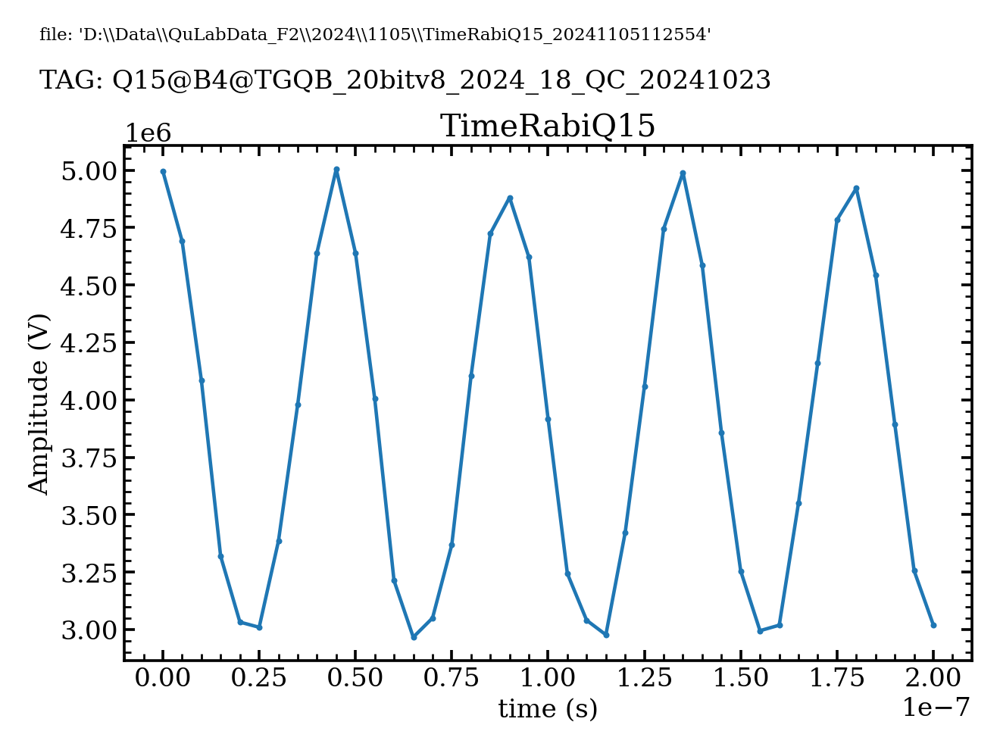

'D:\\Data\\QuLabData_F2\\2024\\1105\\TimeRabiQ15_20241105112554.jpg'


In [14]:
measQ='Q15'
# JPA Setting
# pump_freq = 13.425e9 # unit Hz
# flux = -0.14  # unit dBm
# pump_power = -3  # unit dBm
# JPA = JPACtl(um, cfg_file)
# JPA.JPA_Ctl(measQ, flux, pump_freq, pump_power)
# JPA.reset_offset()

timeList = np.linspace(0,0.2,41)*1e-6
# reset_offset()
setting = {
#         'shots_avg':False,
    
#         'singleShot_mode': 'svm',
    'gateMap': {
            f'{measQ}': ['X_1'],
        },
}
# for measQ in qubits:
#     experiment = adc.Rabi.TimeRabi(measQ, timeList, tags=None, setting=setting)
#     rd=await ADC_Executor(experiment)
experiment = TimeRabi(measQ, timeList, tags=None, setting=setting)
rd=await ADC_Executor(experiment)
reset_offset()

<IPython.core.display.Javascript object>


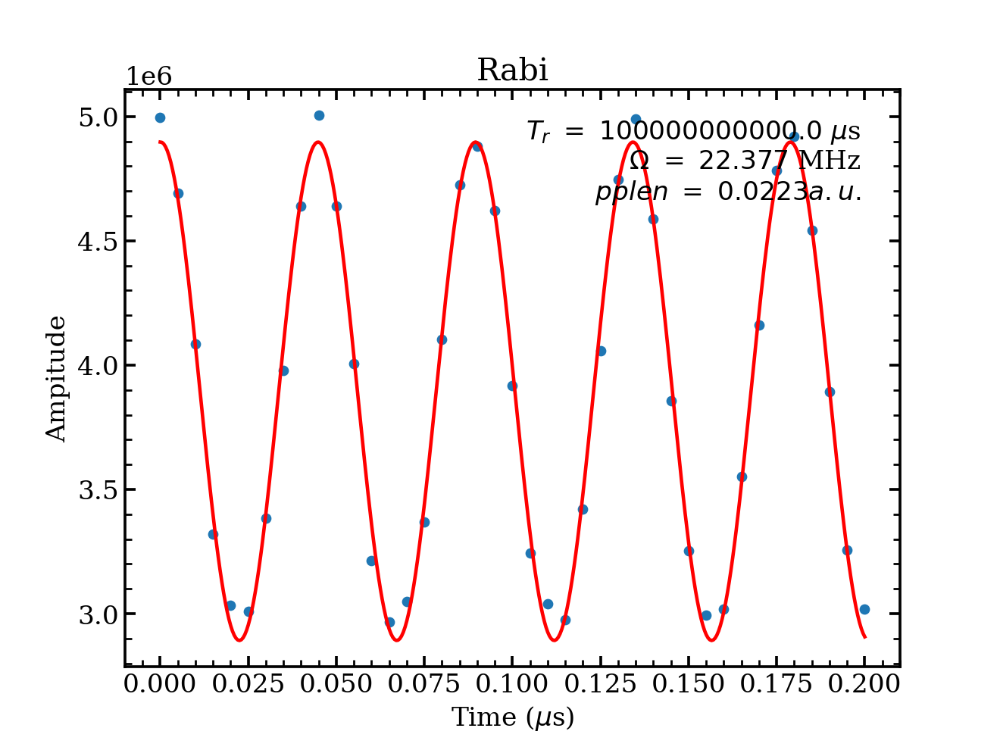

In [16]:
x,z = rd.data
# file='D:\\Data\\QuLabData_F2\\2024\\0302\\TimeRabiQ9_20240302202555.qdat'
# rd=np.load(file,allow_pickle=True)
# x,z=rd['data']

x,z=x*1e6,np.abs(z[:,0])
fit = Fit.Rabi((x,z),p0={'A':1e6,'B':1e6,'Omega':20,'Tr':100000000000})

plt.figure()
fit.plot()

'D:\\Data\\QuLabData_F2\\2024\\1105\\TimeRabiQ15_20241105093319.qdat'


<IPython.core.display.Javascript object>


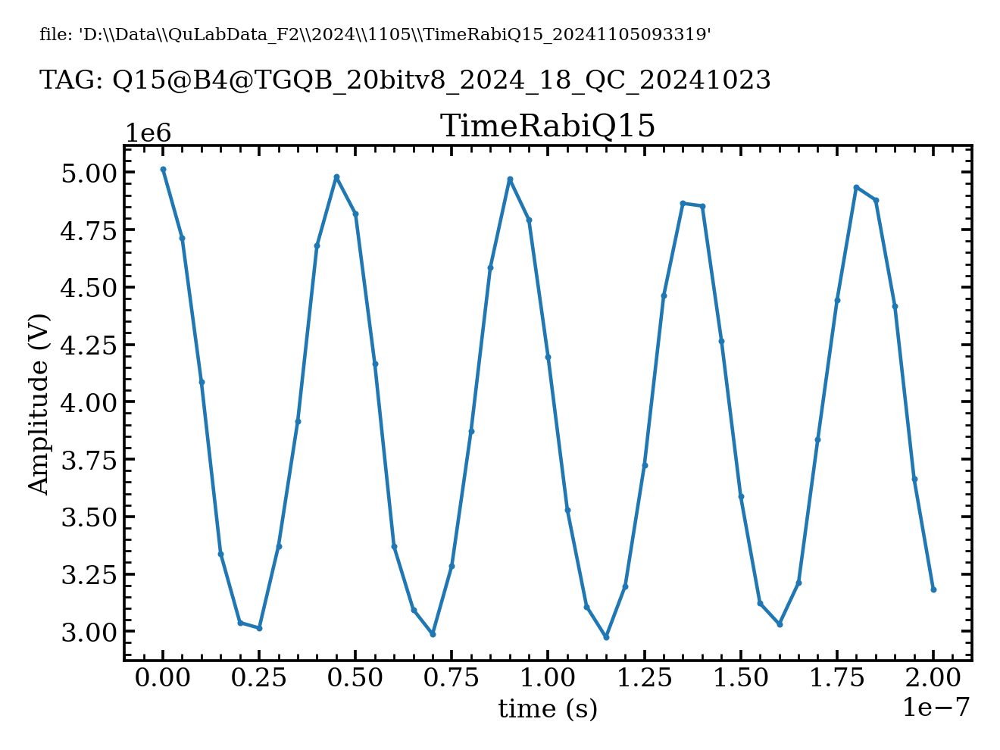

'D:\\Data\\QuLabData_F2\\2024\\1105\\TimeRabiQ15_20241105093319.jpg'


In [12]:
measQ='Q15'
# JPA Setting
# pump_freq = 13.425e9 # unit Hz
# flux = -0.14  # unit dBm
# pump_power = -3  # unit dBm
# JPA = JPACtl(um, cfg_file)
# JPA.JPA_Ctl(measQ, flux, pump_freq, pump_power)
# JPA.reset_offset()

timeList = np.linspace(0,0.2,41)*1e-6
# reset_offset()
setting = {
#         'shots_avg':False,
    
#         'singleShot_mode': 'svm',
    'gateMap': {
            f'{measQ}': ['X'],
        },
}
# for measQ in qubits:
#     experiment = adc.Rabi.TimeRabi(measQ, timeList, tags=None, setting=setting)
#     rd=await ADC_Executor(experiment)
experiment = adc.Rabi.TimeRabi(measQ, timeList, tags=None, setting=setting)
rd=await ADC_Executor(experiment)
reset_offset()

'D:\\Data\\QuLabData_F2\\2024\\1105\\get_ReadoutM_20241105115500.qdat'


<IPython.core.display.Javascript object>


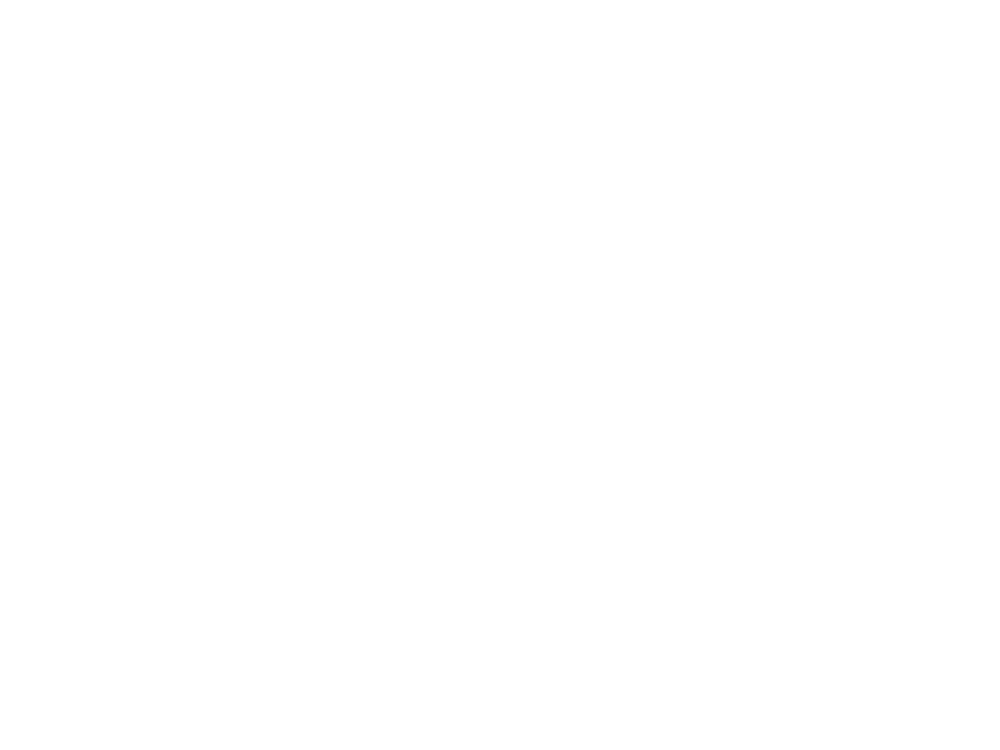

PASS: dim=1; zsize 4000 is too large (>101)!


'D:\\Data\\QuLabData_F2\\2024\\1105\\get_ReadoutM_20241105115500.jpg'
thr=-3104040.165933, phi=0.305009, visibility=0.641, 0.8687171792948238, 0.77265646382694


<IPython.core.display.Javascript object>


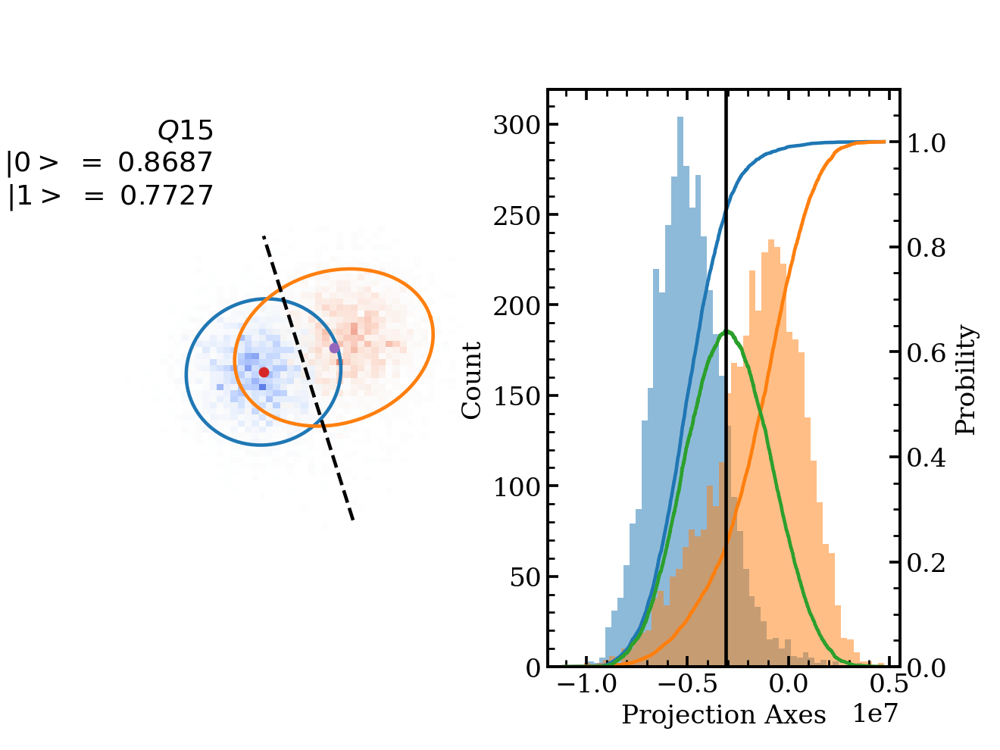

In [7]:
qubits=['Q15']

# reset_offset()
setting = {
#         'readout_mode': 'IQ',        # IQ or TraceIQ, SEQ_IQ
#         'preprocess_mode': None,     # None/original/ref/cali
#         'shots_avg': True,
#         'singleShot_mode': None,     # None/circularRegion/linearSegmentation/circularGround
#         'populationConvert_mode': None,  # None/original/matrixCali
#         'shotsdata_level': 2,
}
for measQ in qubits:
    experiment=adc.readout.get_ReadoutM(measQ, shots=4000, tags=None, setting=setting)
    rd=await ADC_Executor(experiment)
#     rd=await Repeat_Executor(experiment,repeats=1000)

    x,SS=rd.data
    y_g,y_e=SS[0], SS[-1]
    qindex=0
    plotDistribution(measQ,y_g[:,qindex],y_e[:,qindex])

In [9]:
x,SS=rd.data
y_g,y_e=SS[0], SS[-1]
thr,phi = getThresholdParameters(SS[0], SS[-1])
with cfgContext(cfg_file,constrain_init) as config:
    measQ = config['Chip']['current_Qubit']
    qubits=[measQ]
    for i,q in enumerate(qubits):
        d=config[q]['cali']['singleShot']
        d.update(thr=thr[i],phi=phi[i])
        config[q]['cali']['singleShot']=d

In [10]:
from collections import defaultdict

All_PROBs = config['ADC_Meas']['All_PROBs']
All_Readout_Qubits = []
for PROB in All_PROBs:
    All_Readout_Qubits.extend(
        config['ADC_Meas'][PROB]['Multi_Readout']['Qubits'])
            
params = defaultdict(list)
for qubit in All_Readout_Qubits:
    d = config[qubit]['cali']['singleShot']
    for k in ['c0', 'c1', 'r0', 'r1', 'thr', 'phi']:
        params[k].append(d.get(k, None))                
params = {k:np.asarray(v) for k,v in params.items()} 

readoutM= getReadoutM(SS,params=None,mode='svm')

readoutM

array([[0.86875, 0.13125],
       [0.2275 , 0.7725 ]])

In [11]:
with cfgContext(cfg_file,constrain_init) as config:
    config['ADC_Meas']['global']['readout']['Matrix']=readoutM

'D:\\Data\\QuLabData_F2\\2024\\1031\\RamseyQ16_20241031114304.qdat'


<IPython.core.display.Javascript object>


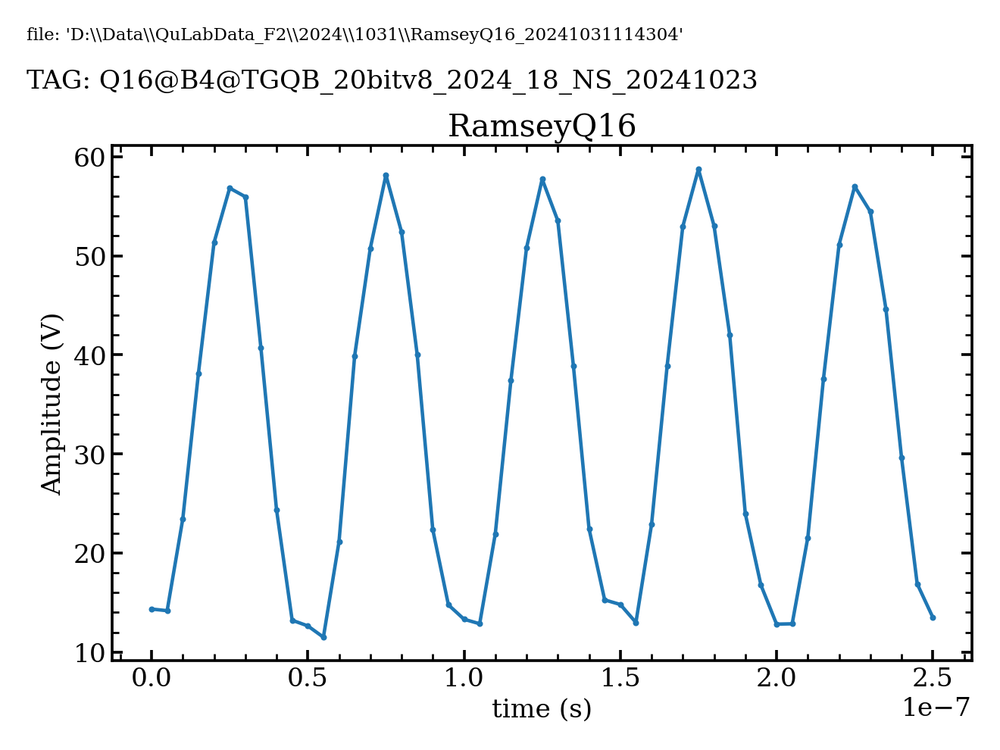

'D:\\Data\\QuLabData_F2\\2024\\1031\\RamseyQ16_20241031114304.jpg'


In [10]:
qubits=['Q16']
timeList = np.linspace(0,0.25,51)*1e-6
# reset_offset()
# rotationList = np.linspace(-70,70,71)*1e6
rotation = 20e6
setting = {
#     'shots_avg':False,
#     'singleShot_mode': 'svm', 
#     'populationConvert_mode': 'original'
#     'gateMap': {
#             'Q1': ['Ramsey'],
#             'Q2': ['Ramsey'],
#         }
}
# cons=((f'cfg.Q1.gate.Exp_gates.time',),(lambda v:v),'cfg.Q2.gate.Exp_gates.time')
# JPA Setting
# pump_freq = 13.425e9 # unit Hz
# flux = -0.14  # unit dBm
# pump_power = -3  # unit dBm
# JPA = JPACtl(um, cfg_file)
# JPA.JPA_Ctl(measQ, flux, pump_freq, pump_power)
# JPA.reset_offset()

for measQ in qubits:
    experiment = adc.Ramsey.Ramsey(measQ, timeList, rotation, tags=None, setting=setting,constrains=[])
    # experiment = adc.Ramsey.Ramsey_rotation(measQ, timeList, rotationList, tags=None, setting=setting)
    rd=await ADC_Executor(experiment)
#     rd=await Repeat_Executor(experiment,delta_time=10)

<IPython.core.display.Javascript object>


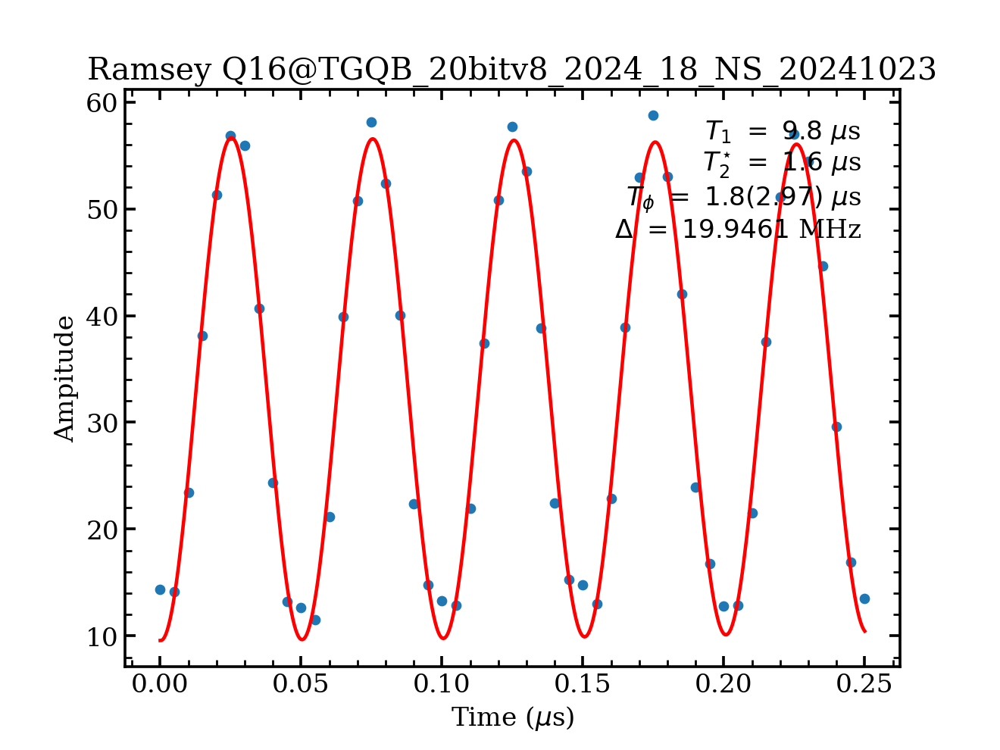

In [11]:
with cfgContext(filedicit_file) as file_dict:
    pass
chip_name=file_dict['chip']
T2star_dict={}
Tphi_dict={}
for qubit,file in file_dict['ADC']['Ramsey'].items():
    if qubit not in ['Q16']:
        continue
    rd=np.load(file[-1],allow_pickle=True)
#     file=r'D:\\Data\\QuLabData\\2022\\1107\\RamseyQ1_20221107095549.qdat'
#     rd=np.load(file,allow_pickle=True)
    x,z=rd['data']
    x,z=x*1e6,np.abs(z[:,0])
    
#     x,z=x*1e6,np.imag(z[:,0]*np.exp(-1j*np.pi/6))
    Delta=rd['ParaSpace']['config'][qubit]['gate']['Exp_gates']['rotation']/1e6
    plt.figure()
#     Delta=12
    fit=Fit.Ramsey((x,z),fixed={'T1':9.8},p0={'A':100,'Delta':Delta,'Tphi':0.3})
#     fit=Fit.Ramsey((x,z),fixed={'T1':13.2},p0={'A':100,'Delta':22,'Tphi':0.2})
#     fit=Fit.Ramsey_withBeat((x,z),fixed={'T1':11.4,},p0={'A':0.2e10,'Delta':0.2,'Delta2':0.06,'Tphi':500})
    fit.plot(plotscript=None)
    plt.title(f'Ramsey {qubit}@{chip_name}')
    T2star_dict[qubit]=fit.params['T2star']
    Tphi_dict[qubit]=fit.params['Tphi']

In [12]:
a=rotation-fit.params['Delta']*1e6
a

53947.32216924429

In [13]:
with cfgContext(cfg_file,constrain_init) as config:
    config[measQ]['para']['drivFreq']+=a

9.0
[1.80e-08 1.85e-08 1.90e-08 1.95e-08 2.00e-08 2.05e-08 2.10e-08 2.15e-08
 2.20e-08]


'D:\\Data\\QuLabData_F2\\2024\\1030\\Test_dynaQ16_20241030194709.qdat'


<IPython.core.display.Javascript object>


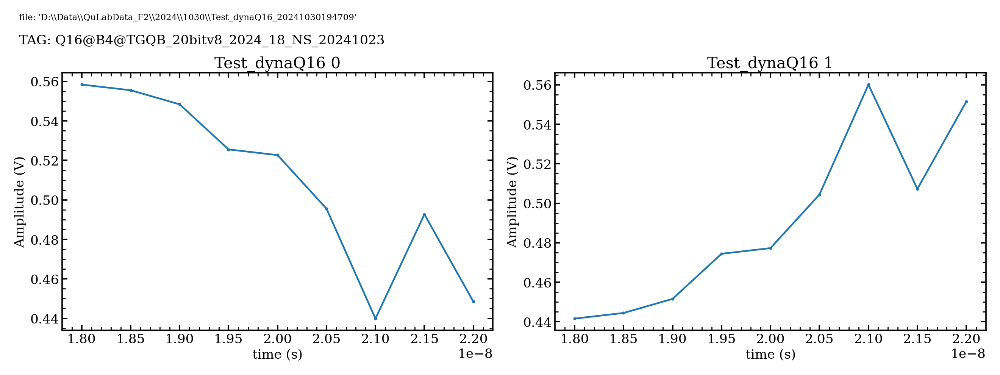

'D:\\Data\\QuLabData_F2\\2024\\1030\\Test_dynaQ16_20241030194709.jpg'
'D:\\Data\\QuLabData_F2\\2024\\1030\\ShotsData_20241030194709.qdat'


In [12]:
measQ='Q16'
with cfgContext(cfg_file) as config:      
    pi_len = config[measQ]['gate']['U_gates']['pi_len']
start = pi_len * 0.9
end = pi_len * 1.1
point = (end - start)  *1e9*2 + 1
print(point)
timeList = np.linspace(start, end , int(point))
# timeList = np.linspace(0,0.2,51)*1e-6
print(timeList)
setting = {
#         'shots_avg':False,
#         'singleShot_mode': 'svm',
}
experiment = Dynamic_pi_length(measQ, timeList, tags=None, setting=setting)
rd=await ADC_Executor(experiment)
reset_offset()

# 动态测试 Pi_amp

In [13]:
def Dynamic_pi_amp(measQ, scaleList, tags=None, setting=None, constrains=None):
    name = 'Dynamic_pi_amp'
    config = set_measQ(measQ)
    chip_name = config['Chip']['name']
    currentProb = config['ADC_Meas']['current_PROB']
    line = config[measQ]['inst']['ADC_PROB']

    setting_default = {
        'readout_mode': 'IQ',
        'preprocess_mode': 'original',
        # 'shots_avg': True,
        'shots_avg': False,
        # 'singleShot_mode': None,
        'singleShot_mode': 'svm',
        'populationConvert_mode': 'matrixCali',
        'shotsdata_level': 2,


        'gateMap': {
            f'{measQ}': ['X_1'],
        },
    }

    sweep_config = {
        'name': f'Dynamic_pi_amp{measQ}',
        'Scale': f'cfg.{measQ}.gate.X_1.pi_amp',
        'unit': {
            'time': 's',
        }
    }
    sweep_setting = {
        'Scale': scaleList,
    }
    _cons = ((f'cfg.{measQ}.para.drivFreq', f'cfg.{measQ}.para.drivLoFreq'), (lambda v1, v2: v1-v2),
             f'cfg.{measQ}.para.drivCarryFreq')
    constrains_default = [*constrain_meas(config, 'cfg.'), _cons]
    tags_default = [f'*{measQ}@{line}@{chip_name}']

    tags = update_default(tags_default, tags)
    setting = update_default(setting_default, setting)
    constrains = update_default(constrains_default, constrains)

    experiment = dict(name=name,
                      measQ=measQ,
                      config=config,
                      setting=setting,
                      tags=tags,
                      sweep_config=sweep_config,
                      sweep_setting=sweep_setting,
                      constrains=constrains)
    return experiment

In [21]:
def Dynamic_pi_amp1(measQ, scaleList, tags=None, setting=None, constrains=None):
    name = 'Dynamic_pi_amp'
    config = set_measQ(measQ)
    chip_name = config['Chip']['name']
    currentProb = config['ADC_Meas']['current_PROB']
    line = config[measQ]['inst']['ADC_PROB']

    setting_default = {
        'readout_mode': 'IQ',
        'preprocess_mode': 'original',
        'shots_avg': True,
        # 'shots_avg': False,
        'singleShot_mode': None,
        # 'singleShot_mode': 'svm',
        'populationConvert_mode': None,
        #     'shotsdata_level': 2,

        'gateMap': {
            f'{measQ}': ['X_1'],
        },
    }

    sweep_config = {
        'name': f'Dynamic_pi_amp{measQ}',
        'Scale': f'cfg.{measQ}.gate.X_1.pi_amp',
        'unit': {
            'time': 's',
        }
    }
    sweep_setting = {
        'Scale': scaleList,
    }
    _cons = ((f'cfg.{measQ}.para.drivFreq', f'cfg.{measQ}.para.drivLoFreq'), (lambda v1, v2: v1-v2),
             f'cfg.{measQ}.para.drivCarryFreq')
    constrains_default = [*constrain_meas(config, 'cfg.'), _cons]
    tags_default = [f'*{measQ}@{line}@{chip_name}']

    tags = update_default(tags_default, tags)
    setting = update_default(setting_default, setting)
    constrains = update_default(constrains_default, constrains)

    experiment = dict(name=name,
                      measQ=measQ,
                      config=config,
                      setting=setting,
                      tags=tags,
                      sweep_config=sweep_config,
                      sweep_setting=sweep_setting,
                      constrains=constrains)
    return experiment

'D:\\Data\\QuLabData_F2\\2024\\1105\\Dynamic_pi_ampQ15_20241105100455.qdat'


<IPython.core.display.Javascript object>


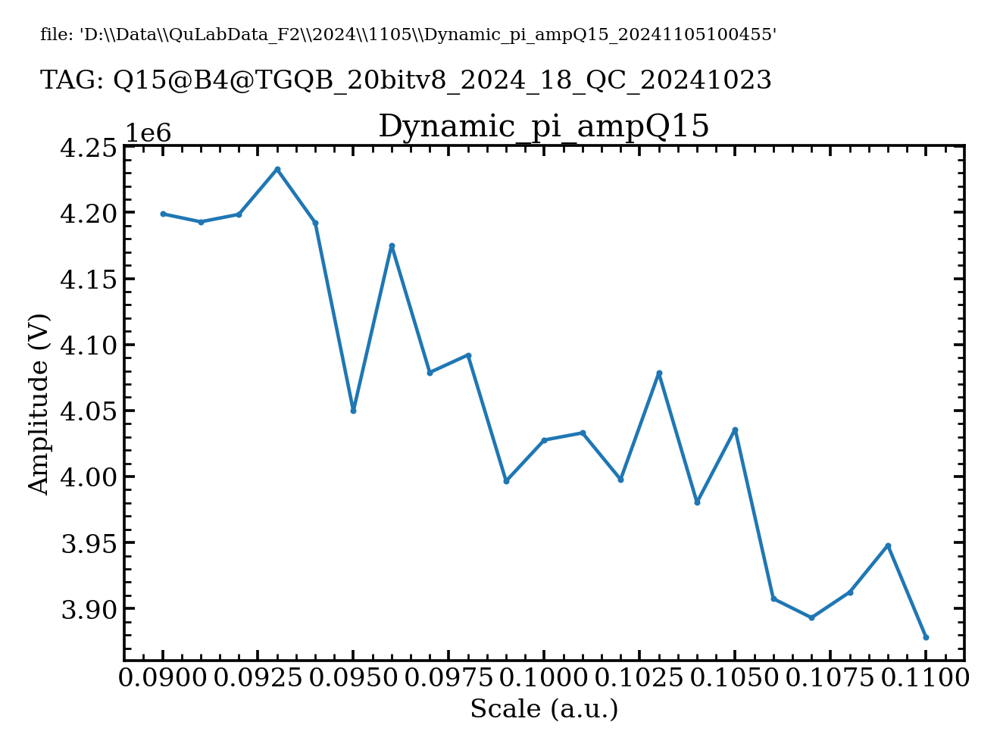

'D:\\Data\\QuLabData_F2\\2024\\1105\\Dynamic_pi_ampQ15_20241105100455.jpg'


In [24]:
measQ = "Q15"
with cfgContext(cfg_file) as config:
#     config[measQ]['gate']['X_1']['pi_len'] = 1e-08
    pi_amp = config[measQ]['gate']['X_1']['pi_amp'] / 2
timeList = np.linspace(pi_amp * 0.9, pi_amp*1.1 , 21)
setting = {
#         'shots_avg':False,
#         'singleShot_mode': 'svm',
}
experiment = Dynamic_pi_amp1(measQ, timeList, tags=None, setting=setting)
rd=await ADC_Executor(experiment)
reset_offset()

'D:\\Data\\QuLabData_F2\\2024\\1105\\Dynamic_pi_ampQ15_20241105095945.qdat'


<IPython.core.display.Javascript object>


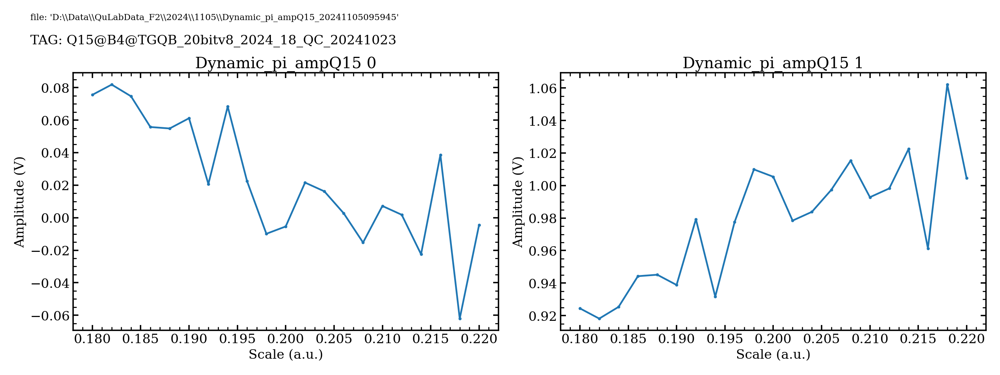

'D:\\Data\\QuLabData_F2\\2024\\1105\\Dynamic_pi_ampQ15_20241105095945.jpg'
'D:\\Data\\QuLabData_F2\\2024\\1105\\ShotsData_20241105095945.qdat'


In [23]:
measQ = "Q15"
with cfgContext(cfg_file) as config:
#     config[measQ]['gate']['X_1']['pi_len'] = 1e-08
    pi_amp = config[measQ]['gate']['X_1']['pi_amp']
timeList = np.linspace(pi_amp * 0.9, pi_amp*1.1 , 21)
setting = {
#         'shots_avg':False,
#         'singleShot_mode': 'svm',
}
experiment = Dynamic_pi_amp(measQ, timeList, tags=None, setting=setting)
rd=await ADC_Executor(experiment)
reset_offset()

# 动态测试 drive_freq

In [30]:
def Dynamic_drive_freq(measQ, driveList, tags=None, setting=None, constrains=None):
    name = 'Dynamic_drive_freq'
    config = set_measQ(measQ)
    chip_name = config['Chip']['name']
    currentProb = config['ADC_Meas']['current_PROB']
    line = config[measQ]['inst']['ADC_PROB']

    setting_default = {
        'readout_mode': 'IQ',
        'preprocess_mode': 'original',
        # 'shots_avg': True,
        'shots_avg': False,
        # 'singleShot_mode': None,
        'singleShot_mode': 'svm',
        'populationConvert_mode': 'matrixCali',
        'shotsdata_level': 2,
        'gateMap': {
            f'{measQ}': ['U_0_90'],
        },
    }

    sweep_config = {
        'name': f'Dynamic_drive_freq{measQ}',
        'drive_freq': f'cfg.{measQ}.para.drivFreq',
    }
    sweep_setting = {
        'drive_freq': driveList,
    }
    _cons = ((f'cfg.{measQ}.para.drivFreq', f'cfg.{measQ}.para.drivLoFreq'), (lambda v1, v2: v1-v2),
             f'cfg.{measQ}.para.drivCarryFreq')
    constrains_default = [*constrain_meas(config, 'cfg.'), _cons]
    tags_default = [f'*{measQ}@{line}@{chip_name}']

    tags = update_default(tags_default, tags)
    setting = update_default(setting_default, setting)
    constrains = update_default(constrains_default, constrains)

    experiment = dict(name=name,
                      measQ=measQ,
                      config=config,
                      setting=setting,
                      tags=tags,
                      sweep_config=sweep_config,
                      sweep_setting=sweep_setting,
                      constrains=constrains)
    return experiment

'D:\\Data\\QuLabData_F2\\2024\\1030\\Dynamic_drive_freqQ16_20241030195351.qdat'


<IPython.core.display.Javascript object>


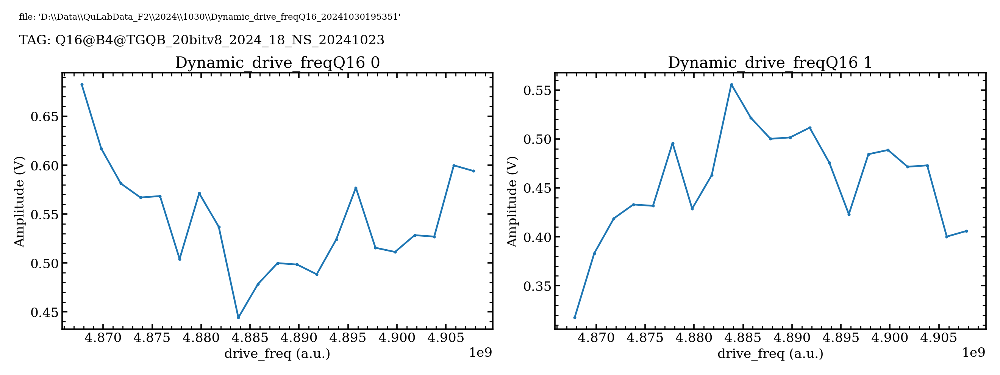

'D:\\Data\\QuLabData_F2\\2024\\1030\\Dynamic_drive_freqQ16_20241030195351.jpg'
'D:\\Data\\QuLabData_F2\\2024\\1030\\ShotsData_20241030195351.qdat'


In [31]:
with cfgContext(cfg_file) as config:      
    drive_freq = config[measQ]['para']['drivFreq']
driveList = np.linspace(-20, 20, 21)*1e6+drive_freq
setting = {
#         'shots_avg':False,
#         'singleShot_mode': 'svm',
}
experiment = Dynamic_drive_freq(measQ, driveList, tags=None, setting=setting)
rd=await ADC_Executor(experiment)
reset_offset()

# 动态测试 Phase

In [28]:
def Dynamic_phase(measQ, phaseList, tags=None, setting=None, constrains=None):
    name = 'Dynamic_phase'
    config = set_measQ(measQ)
    chip_name = config['Chip']['name']
    currentProb = config['ADC_Meas']['current_PROB']
    line = config[measQ]['inst']['ADC_PROB']
    setting_default = {
        'readout_mode': 'IQ',
        'preprocess_mode': 'original',
        # 'shots_avg': True,
        'shots_avg': False,
        # 'singleShot_mode': None,
        'singleShot_mode': 'svm',
        'populationConvert_mode': 'matrixCali',
        'shotsdata_level': 2,
        'gateMap': {f'{measQ}':[]},
        'phase':0,
    }
    sweep_config = {
        'name': f'Dynamic_phase{measQ}',
        'phase':'st.phase',
    }
    sweep_setting = {
        'phase': phaseList,
    }

    def func(phase):
        gateMap = {
            f'{measQ}':[f'U_{phase}_90']
#             measQ:[f'U_{phase}_90'],
        }

        return gateMap

    
    cons = (('st.phase',), func, 'st.gateMap')
    
#     cons = ('st.')
    _cons = ((f'cfg.{measQ}.para.drivFreq', f'cfg.{measQ}.para.drivLoFreq'), (lambda v1, v2: v1-v2),
             f'cfg.{measQ}.para.drivCarryFreq')
    constrains_default = [*constrain_meas(config, 'cfg.'), _cons, cons]
    tags_default = [f'*{measQ}@{line}@{chip_name}']

    tags = update_default(tags_default, tags)
    setting = update_default(setting_default, setting)
    constrains = update_default(constrains_default, constrains)
 
    experiment = dict(name=name,
                      measQ=measQ,
                      config=config,
                      setting=setting,
                      tags=tags,
                      sweep_config=sweep_config,
                      sweep_setting=sweep_setting,
                      constrains=constrains)
    return experiment

'D:\\Data\\QuLabData_F2\\2024\\1030\\Dynamic_phaseQ16_20241030195243.qdat'


<IPython.core.display.Javascript object>


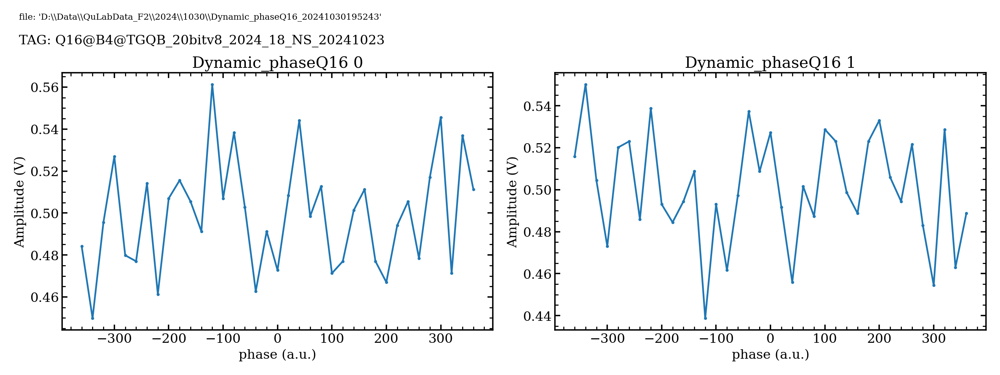

'D:\\Data\\QuLabData_F2\\2024\\1030\\Dynamic_phaseQ16_20241030195243.jpg'
'D:\\Data\\QuLabData_F2\\2024\\1030\\ShotsData_20241030195244.qdat'


In [29]:
measQ='Q16'
phaseList = np.linspace(-360, 360, 37)
setting = {
#         'shots_avg':False,
#         'singleShot_mode': 'svm',
}
experiment = Dynamic_phase(measQ, phaseList, tags=None, setting=setting)
rd=await ADC_Executor(experiment)
reset_offset()

In [36]:
deps = ('st.phase')
for k_dep in deps:
    print(k_dep)

st.phase


# RB

'D:\\Data\\QuLabData_F2\\2024\\1030\\DRAG_20241030195934.qdat'


<IPython.core.display.Javascript object>


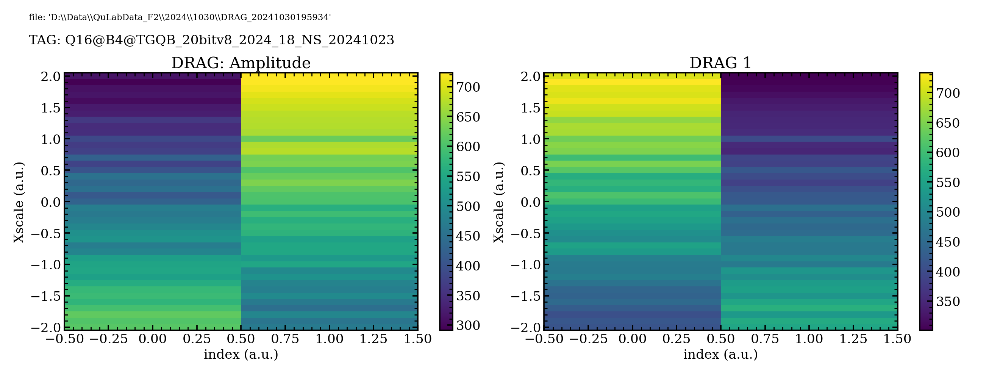

'D:\\Data\\QuLabData_F2\\2024\\1030\\DRAG_20241030195934.jpg'


In [10]:
measQ='Q16'
tags=None

setting = {
        'shots_avg':False,
        'singleShot_mode': 'svm',
}

scaleList = np.linspace(-2,2,41)
experiment = adc.DRAG.DRAG(measQ, scaleList, tags=tags, setting=setting)
rd=await ADC_Executor(experiment)


-0.9256


<IPython.core.display.Javascript object>


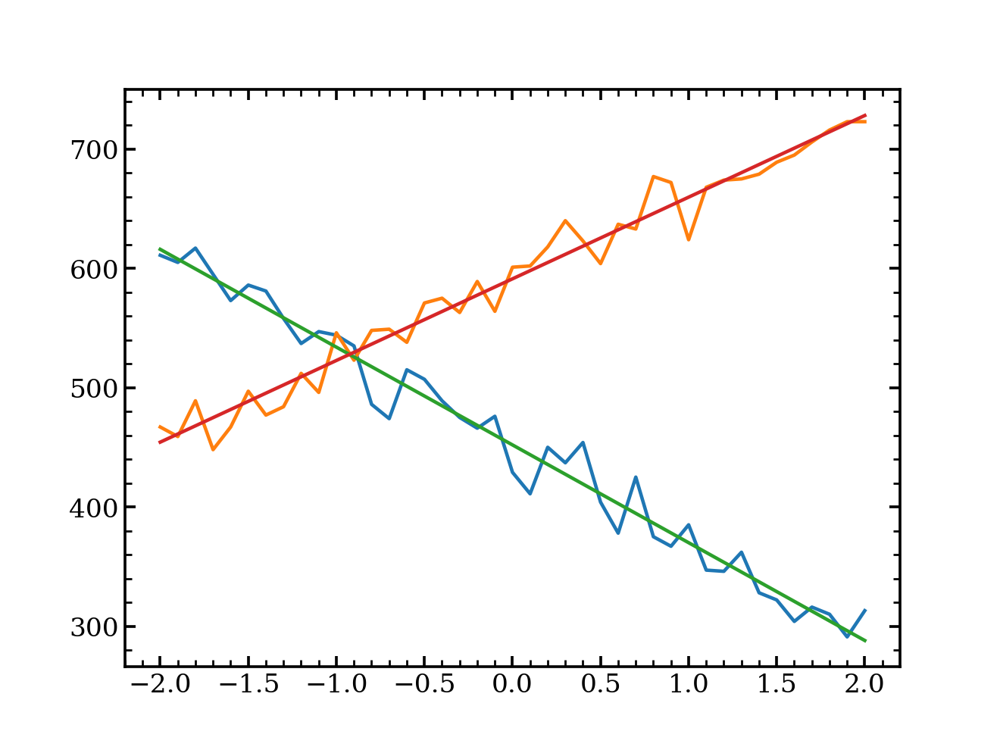

In [11]:
x,y,z=rd.data
# rd=np.load('D:\\Data\\QuLabData_F1\\2024\\0116\\DRAG_20240116142716.qdat',allow_pickle=True)
# x,y,z=rd['data']

qindex=0     #########################################################################################
y, amp_1 = y,z[0]
y, amp_2 = y,z[1]
amp_1=np.abs(amp_1[:,qindex])
amp_2=np.abs(amp_2[:,qindex])

fit1=np.polyfit(y,amp_1,1)
fit2=np.polyfit(y,amp_2,1)
func1=np.poly1d(fit1)
func2=np.poly1d(fit2)
# y_f=np.linspace(y[0],y[-1],10001)
y_f=np.linspace(-2,2,100001)
index=np.argmin(np.abs(func1(y_f)-func2(y_f)))
opt_res=y_f[index]
print(opt_res)

plt.figure()
plt.plot(y,amp_1,y,amp_2,y,func1(y),y,func2(y))

In [12]:
with cfgContext(cfg_file,constrain_init) as config:
    config[measQ]['gate']['U_gates']['lambda1']=opt_res

'D:\\Data\\QuLabData_F2\\2024\\1030\\AllXY_20241030200128.qdat'


<IPython.core.display.Javascript object>


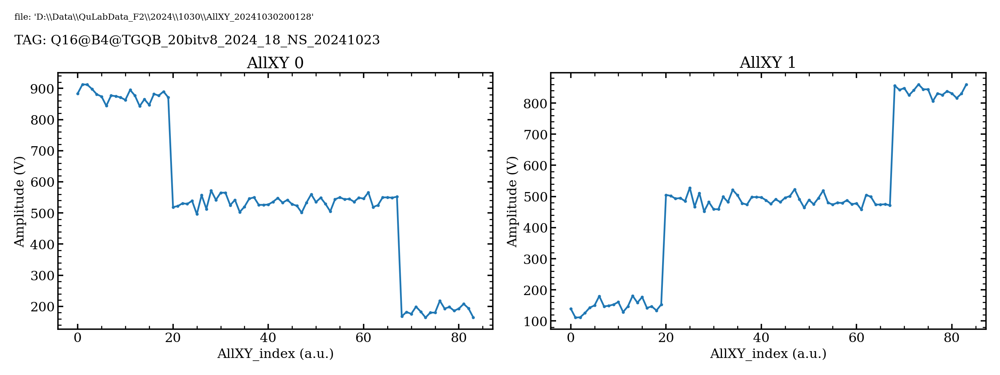

'D:\\Data\\QuLabData_F2\\2024\\1030\\AllXY_20241030200128.jpg'


In [13]:
measQ='Q16'
# reset_offset()

setting = {
        'shots_avg':False,
        'singleShot_mode': 'svm',
}
experiment = adc.AllXY.AllXY(measQ, repeat=4, tags=None, setting=setting)
rd=await ADC_Executor(experiment)

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031120304.qdat'


<IPython.core.display.Javascript object>


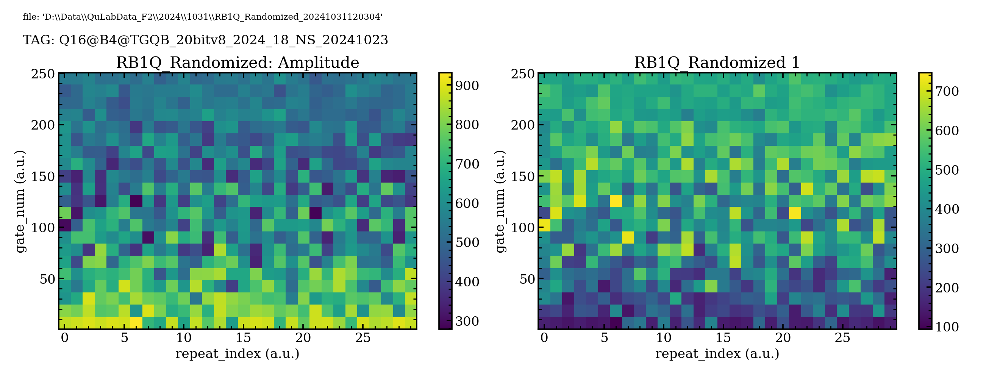

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031120304.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031120730.qdat'


<IPython.core.display.Javascript object>


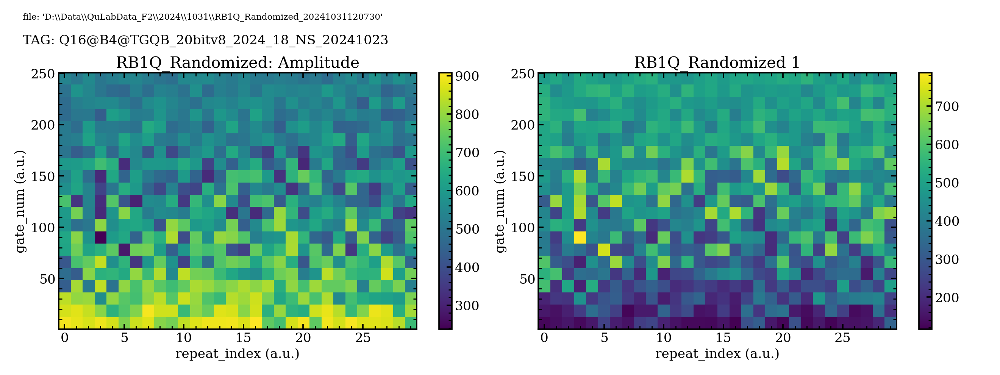

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031120730.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031121157.qdat'


<IPython.core.display.Javascript object>


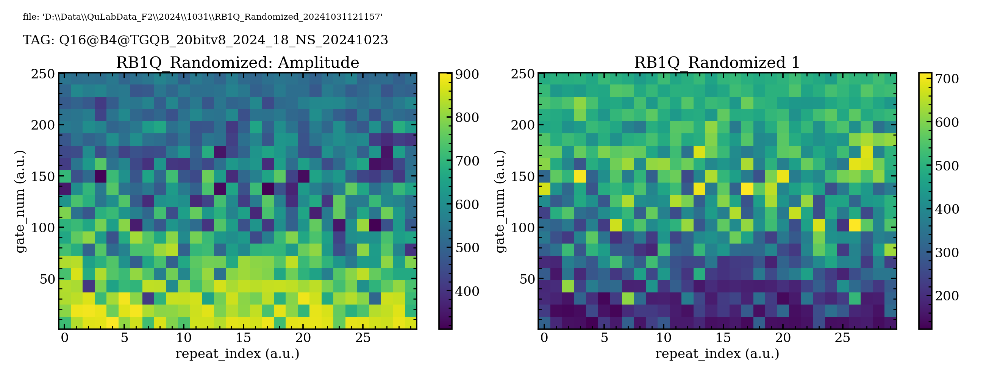

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031121157.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031121622.qdat'


<IPython.core.display.Javascript object>


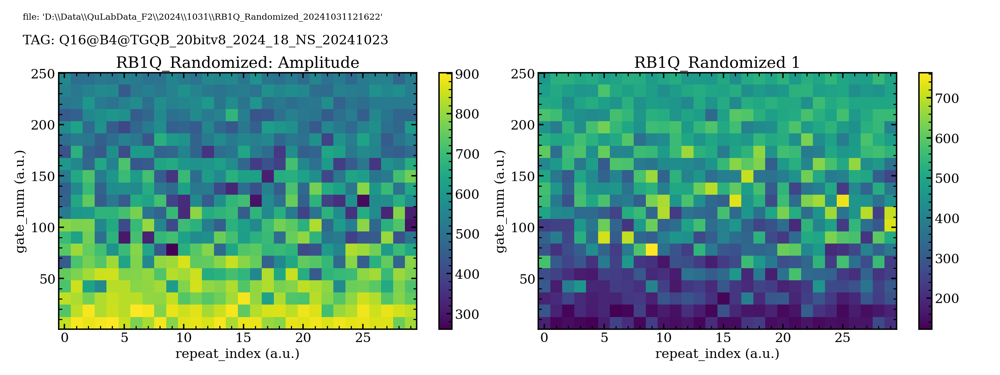

C:\Python39\lib\site-packages\matplotlib\artist.py:1151: RuntimeWarning: coroutine 'seq_exe' was never awaited
  with cbook._setattr_cm(self, eventson=False):
C:\Python39\lib\site-packages\matplotlib\artist.py:1151: RuntimeWarning: coroutine 'BaseManager.setValue' was never awaited
  with cbook._setattr_cm(self, eventson=False):


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031121622.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031122047.qdat'


<IPython.core.display.Javascript object>


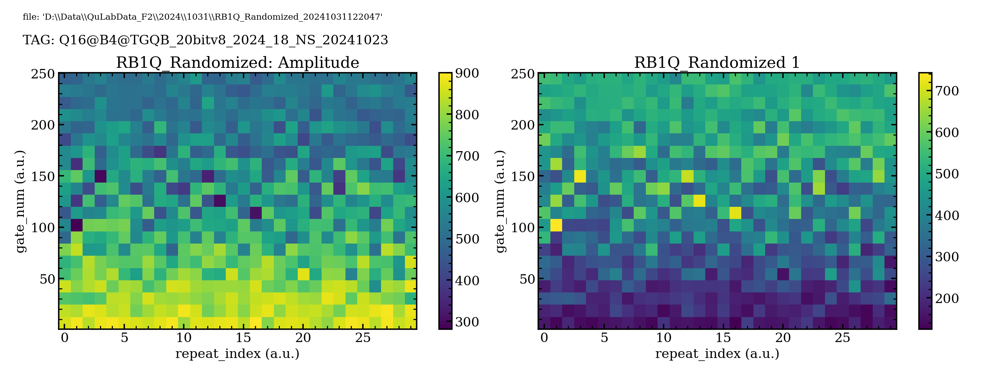

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031122047.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031122512.qdat'


<IPython.core.display.Javascript object>


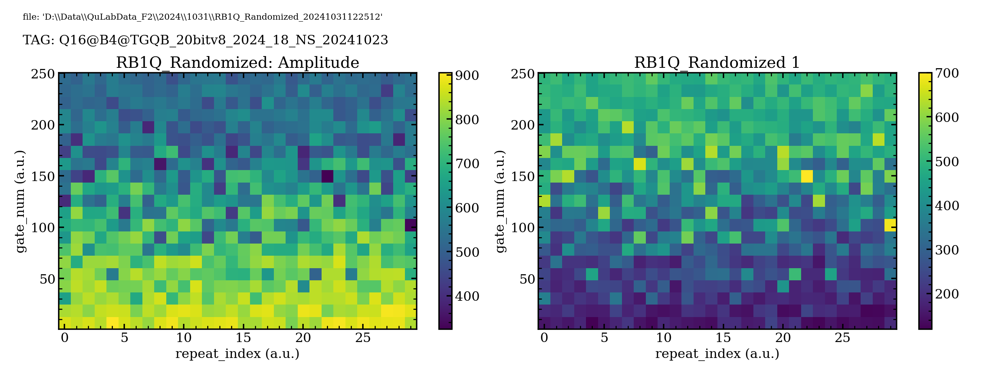

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031122512.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031122937.qdat'


<IPython.core.display.Javascript object>


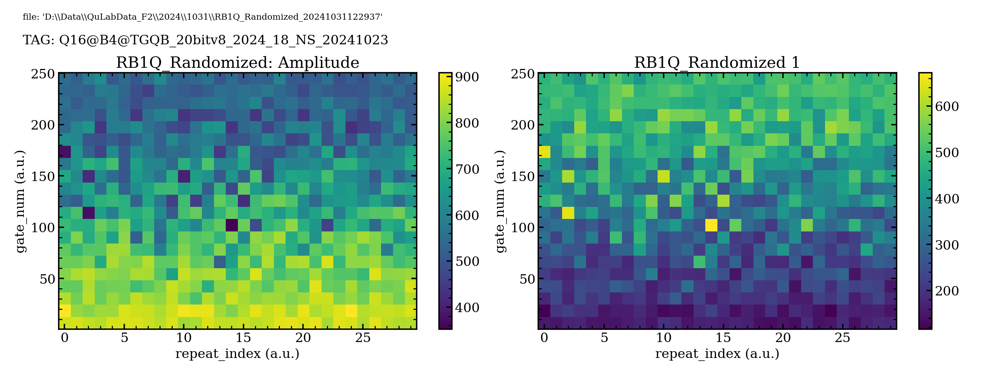

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031122937.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031123402.qdat'


<IPython.core.display.Javascript object>


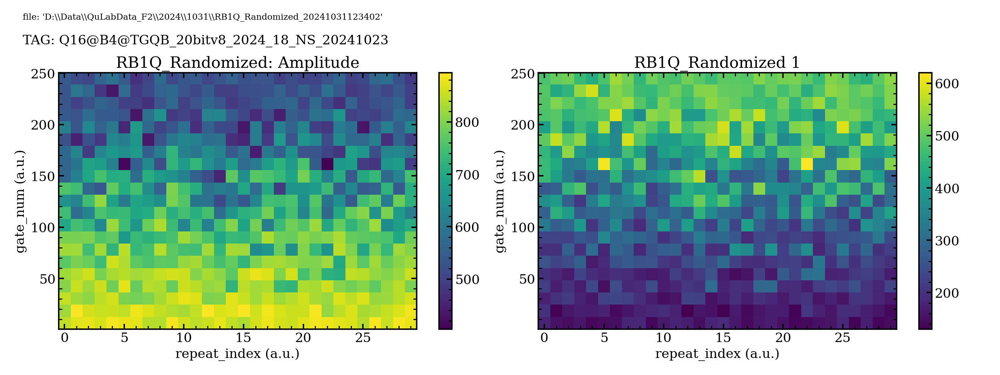

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031123402.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031123827.qdat'


<IPython.core.display.Javascript object>


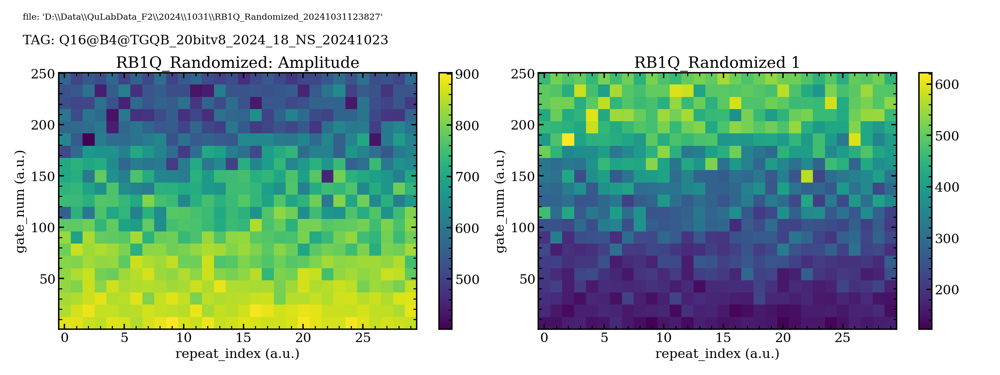

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031123827.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031124251.qdat'


<IPython.core.display.Javascript object>


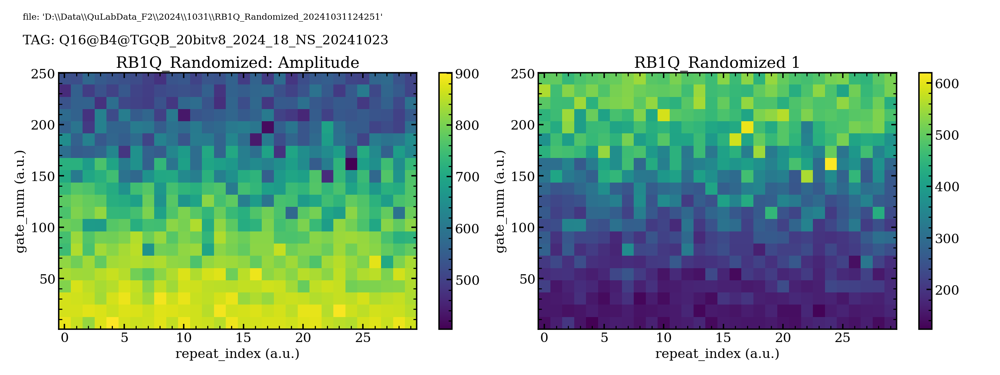

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031124251.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031124717.qdat'


<IPython.core.display.Javascript object>


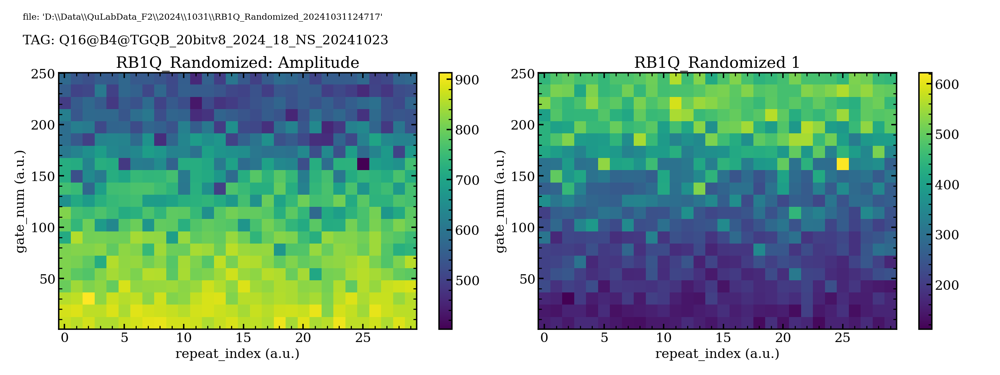

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031124717.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031125142.qdat'


<IPython.core.display.Javascript object>


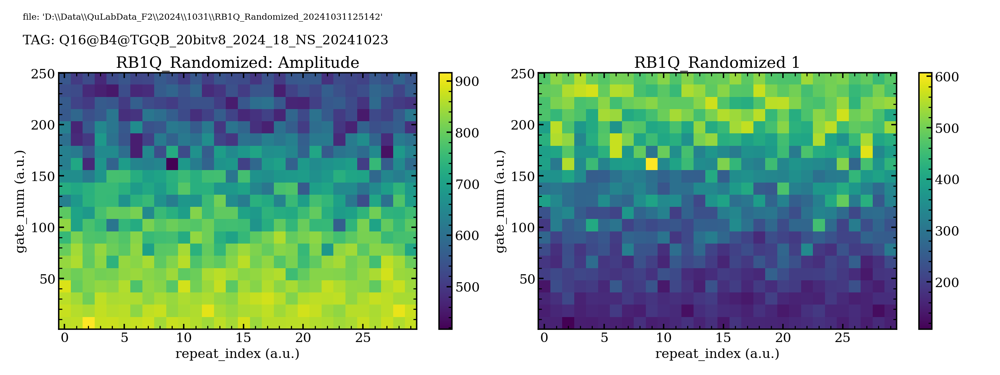

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031125142.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031125606.qdat'


<IPython.core.display.Javascript object>


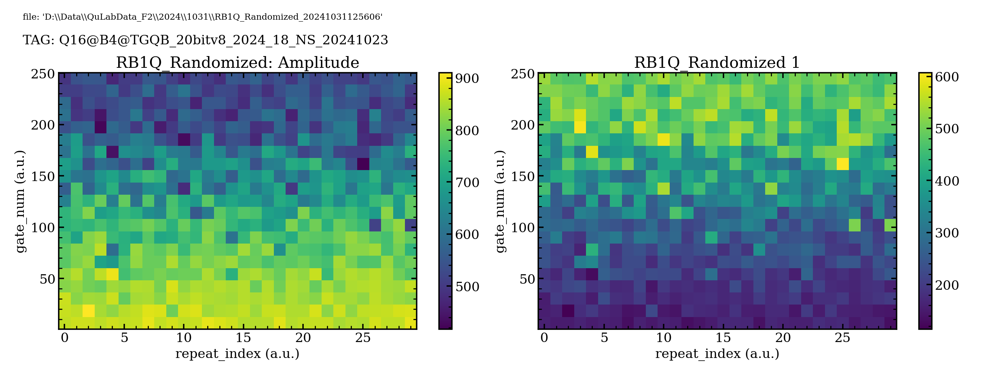

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031125606.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031130031.qdat'


<IPython.core.display.Javascript object>


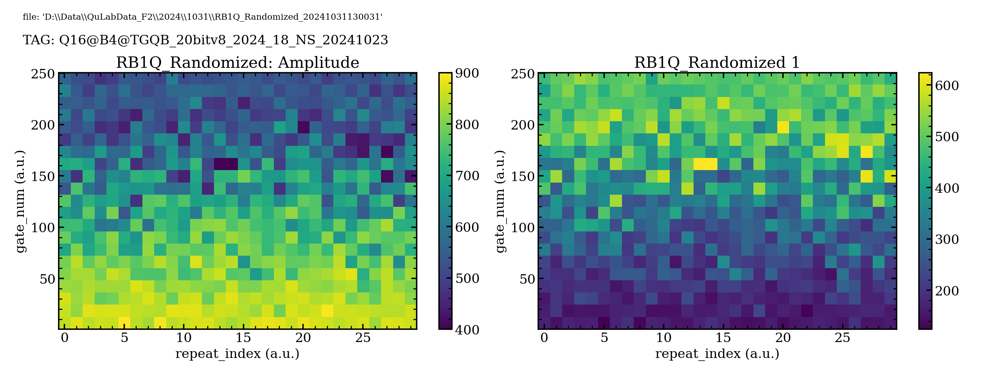

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031130031.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031130456.qdat'


<IPython.core.display.Javascript object>


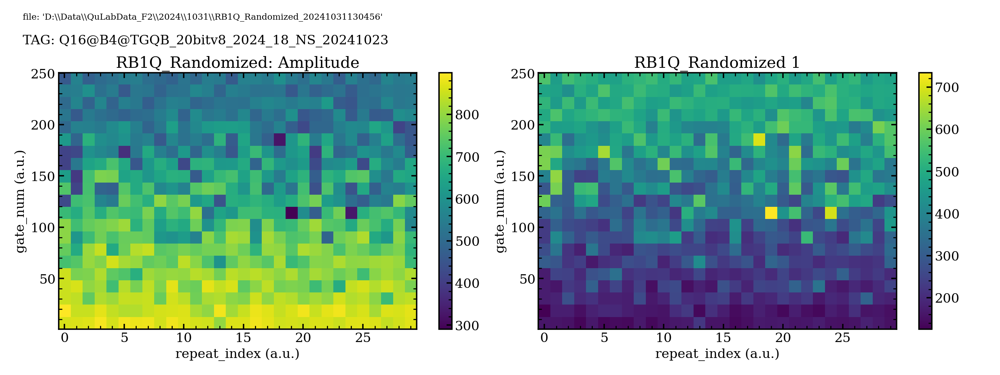

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031130456.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031130921.qdat'


<IPython.core.display.Javascript object>


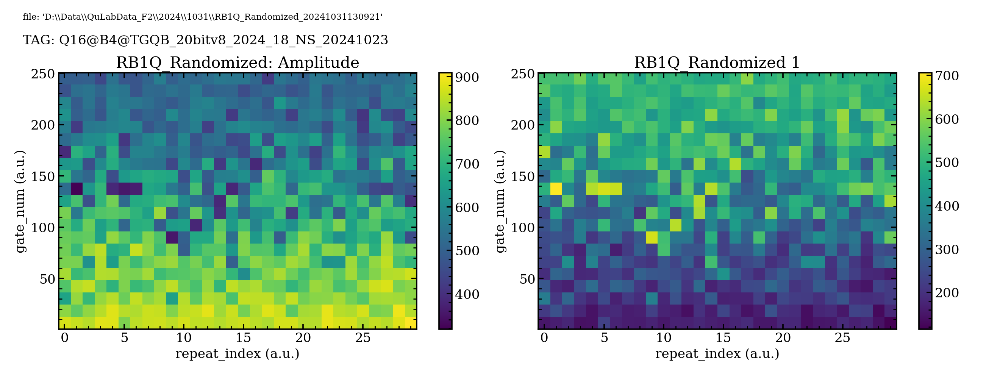

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031130921.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031131346.qdat'


<IPython.core.display.Javascript object>


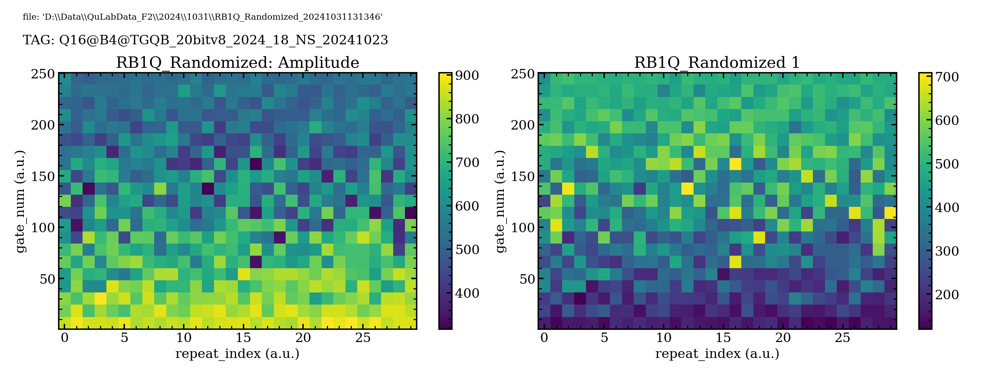

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031131346.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031131812.qdat'


d:\repos\coding_tgqos\measmodule\QOS\Collector\utils.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure() if fig is None else fig


<IPython.core.display.Javascript object>


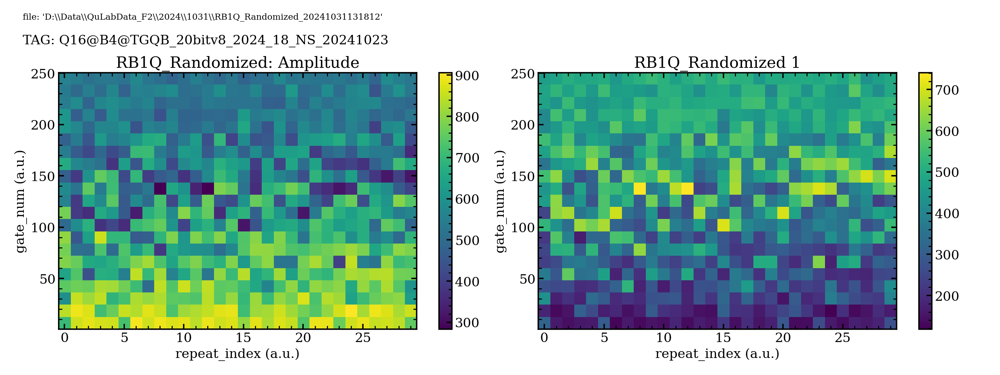

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031131812.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031132236.qdat'


<IPython.core.display.Javascript object>


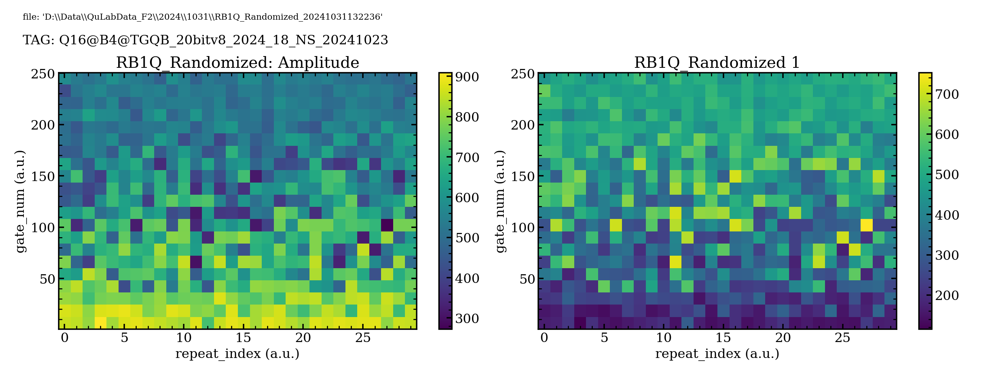

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031132236.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031132701.qdat'


<IPython.core.display.Javascript object>


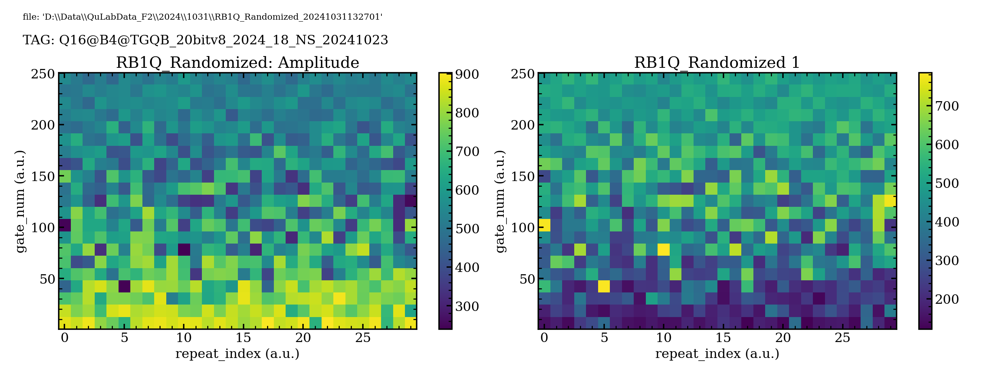

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031132701.jpg'


'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031133126.qdat'


<IPython.core.display.Javascript object>


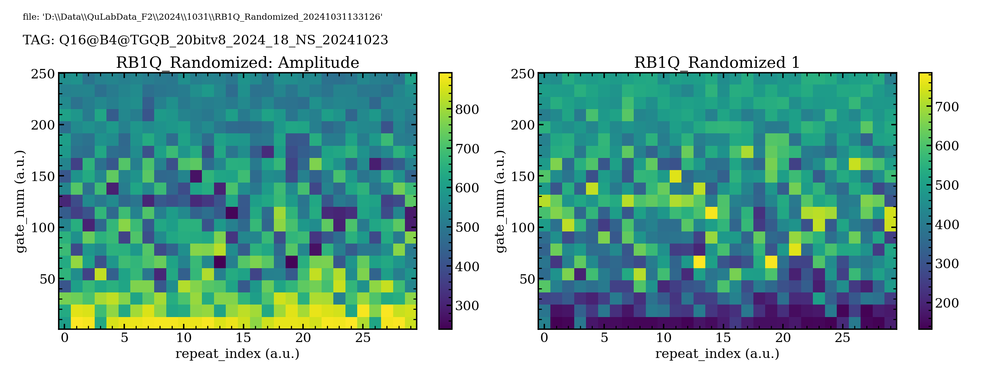

'D:\\Data\\QuLabData_F2\\2024\\1031\\RB1Q_Randomized_20241031133126.jpg'


In [17]:
measQ='Q16'
tags=None
pi_amp = 0.3396
timeList = np.linspace(pi_amp * 0.8, pi_amp*1.2 , 21)
for i in timeList:
    with cfgContext(cfg_file) as config:      
        config[measQ]['gate']['U_gates']['pi_amp'] = i
    setting = {
            'shots_avg':False,
            'singleShot_mode': 'svm',
    }
    gate_num = [1, 2, 4, 6, 8, 10, 13, 16, 20, 25, 30, 35, 40, 50, 70, 90, 110, 140, 180, 200, 250]
    # gate_num = [1, 2, 4, 6, 8, 10, 13, 16, 20, 25, 30, 35, 40, 50, 70, 90, 110, 140, 180]
    experiment = adc.RB1Q.RB(measQ, gate_num=gate_num, repeats=30, tags=None, setting=setting, constrains=None)
    rd=await ADC_Executor(experiment)
with cfgContext(cfg_file) as config:      
    config[measQ]['gate']['U_gates']['pi_amp'] = 0.3396

<IPython.core.display.Javascript object>


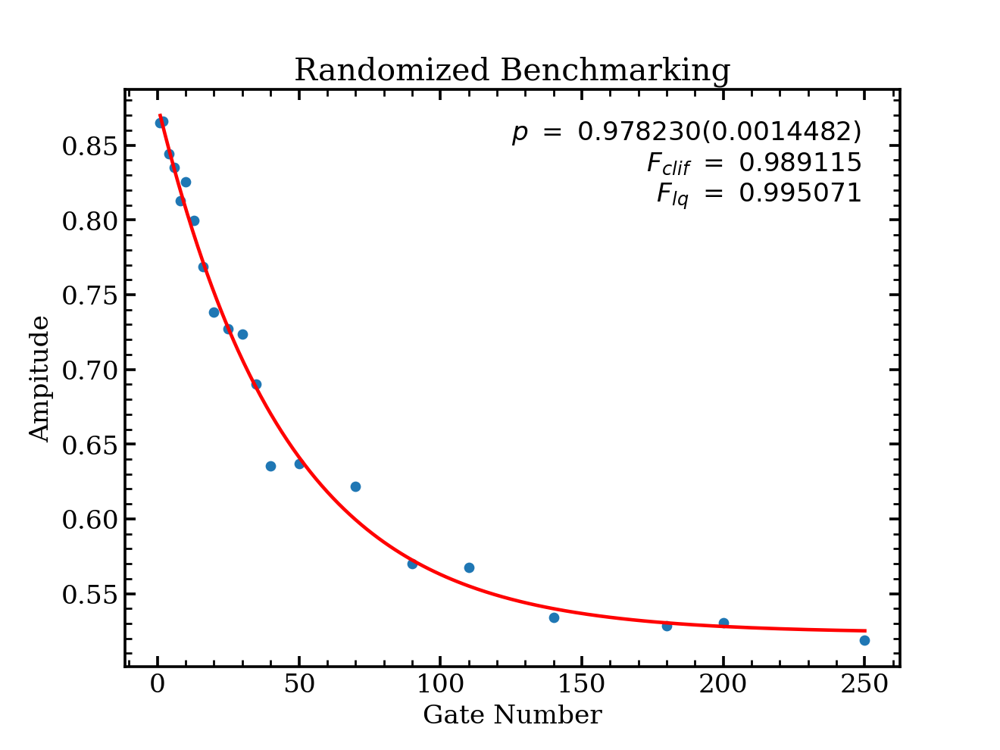

In [17]:
from QOS.Tools.Fit import FitIndex
RBM_Fit=FitIndex('RB')
#     file=r'E:\QuLabData_PC3\2021\0504\RamseyQ9_20210504135615.qdat'
#     rd=np.load(file,allow_pickle=True)|
#     x,y,z=rd['data']
x,y,z=rd.data
fit=Fit.RB((y,z[:,:,0].T.real.mean(axis=1)/1000),p0=[1,0.5,0.99])

plt.figure()
fit.plot()

In [30]:
import logging
logger = logging.getLogger()
logger.setLevel(logging.ERROR)

# QST1Q

In [12]:
import numpy as np
from QOS.Register import constrain_init, constrain_meas

from copy import deepcopy

from meas.utils import set_measQ, update_default

In [13]:
def dyn_QST1Q(measQ, scaleList,tags=None,shots=1024, setting=None, constrains=None):
    name = 'dyn_QST1Q'
    config = set_measQ(measQ)
    chip_name = config['Chip']['name']
    currentProb = config['ADC_Meas']['current_PROB']
    line = config[measQ]['inst']['ADC_PROB']

    config['ADC_Meas'][currentProb]['para']['shots'] = shots

    setting_default = {
        'readout_mode': 'IQ',
        'preprocess_mode': 'original',
        'shots_avg': True,
        'singleShot_mode': None,
        'populationConvert_mode': None,
        'gateMap': {
            f'{measQ}': [],
        },
        'qst_map': {
            0: 'I',
            1: 'X/2',
            2: 'Y/2',
            3: 'X/2',
            4: 'Y/2',
            5: 'X'
        },
        'state_preparation': {
            f'{measQ}': ['X_1'],
        },
        'qst_index':0,
    }

    sweep_config = {
        'name': 'dyn_QST1Q',
        'qst_index':'st.qst_index',
        'state_preparation':'st.state_preparation',
        'Scale': f'cfg.{measQ}.gate.X_1.pi_amp',
        }
    
    sweep_setting = {
        'qst_index': [0,1,2],
        'Scale':scaleList
    }

    def func(state_preparation, qst_index, qst_map): 
        gm = deepcopy(state_preparation)
        gap = 'Blank_2e-9'
        gm[measQ].extend([gap, qst_map[qst_index]])
        return gm

    _cons = (('st.state_preparation','st.qst_index','st.qst_map'), func, 'st.gateMap')
    constrains_default = [*constrain_meas(config, 'cfg.'), _cons]
    tags_default = [f'*{measQ}@{line}@{chip_name}']

    tags = update_default(tags_default, tags)
    setting = update_default(setting_default, setting)
    constrains = update_default(constrains_default, constrains)

    experiment = dict(name=name,
                      measQ=measQ,
                      config=config,
                      setting=setting,
                      tags=tags,
                      sweep_config=sweep_config,
                      sweep_setting=sweep_setting,
                      constrains=constrains)
    return experiment

'D:\\Data\\QuLabData_F2\\2024\\1105\\dyn_QST1Q_20241105115812.qdat'


<IPython.core.display.Javascript object>


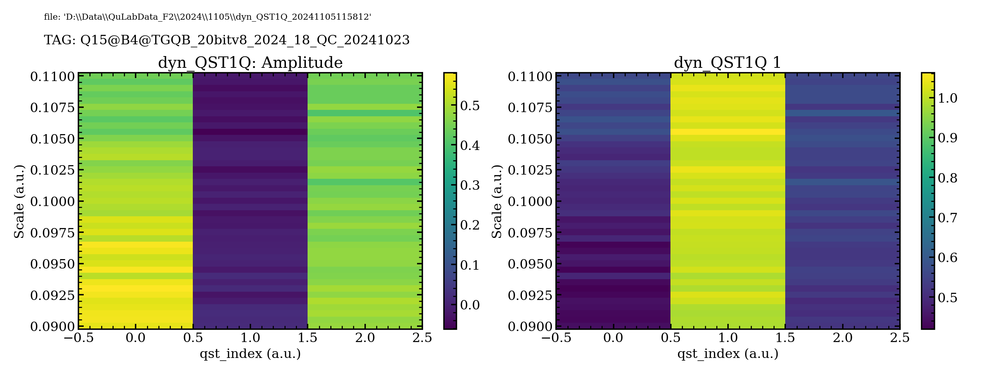

'D:\\Data\\QuLabData_F2\\2024\\1105\\dyn_QST1Q_20241105115812.jpg'


In [16]:
measQ = "Q15"
with cfgContext(cfg_file) as config:
    config[measQ]['gate']['X_1']['pi_amp'] = 0.1
pi_amp = 0.1
setting = {
    'shots_avg':False,
    'singleShot_mode': 'svm',
    'populationConvert_mode': 'matrixCali',
#     'populationConvert_mode': None,
        'state_preparation': {
            f'{measQ}': ['X_1',]
        },
}
scaleList = np.linspace(pi_amp * 0.9, pi_amp*1.1 , 41)
experiment = dyn_QST1Q(measQ, scaleList,tags=None,shots=2000, setting=setting, constrains=None)
rd=await ADC_Executor(experiment)
reset_offset()

In [17]:
def dyn_QST1Q_len(measQ, timeList,tags=None,shots=1024, setting=None, constrains=None):
    name = 'dyn_QST1Q'
    config = set_measQ(measQ)
    chip_name = config['Chip']['name']
    currentProb = config['ADC_Meas']['current_PROB']
    line = config[measQ]['inst']['ADC_PROB']

    config['ADC_Meas'][currentProb]['para']['shots'] = shots

    setting_default = {
        'readout_mode': 'IQ',
        'preprocess_mode': 'original',
        'shots_avg': True,
        'singleShot_mode': None,
        'populationConvert_mode': None,
        'gateMap': {
            f'{measQ}': [],
        },
        'qst_map': {
            0: 'I',
            1: 'X/2',
            2: 'Y/2',
            3: 'X/2',
            4: 'Y/2',
            5: 'X'
        },
        'state_preparation': {
            f'{measQ}': ['X_1'],
        },
        'qst_index':0,
    }

    sweep_config = {
        'name': 'dyn_QST1Q',
        'qst_index':'st.qst_index',
        'state_preparation':'st.state_preparation',
        'time': f'cfg.{measQ}.gate.X_1.pi_len',
        }
    
    sweep_setting = {
        'qst_index': [0,1,2],
        'time':timeList
    }

    def func(state_preparation, qst_index, qst_map): 
        gm = deepcopy(state_preparation)
        gap = 'Blank_2e-9'
        gm[measQ].extend([gap, qst_map[qst_index]])
        return gm

    _cons = (('st.state_preparation','st.qst_index','st.qst_map'), func, 'st.gateMap')
    constrains_default = [*constrain_meas(config, 'cfg.'), _cons]
    tags_default = [f'*{measQ}@{line}@{chip_name}']

    tags = update_default(tags_default, tags)
    setting = update_default(setting_default, setting)
    constrains = update_default(constrains_default, constrains)

    experiment = dict(name=name,
                      measQ=measQ,
                      config=config,
                      setting=setting,
                      tags=tags,
                      sweep_config=sweep_config,
                      sweep_setting=sweep_setting,
                      constrains=constrains)
    return experiment

'D:\\Data\\QuLabData_F2\\2024\\1105\\dyn_QST1Q_20241105115935.qdat'


<IPython.core.display.Javascript object>


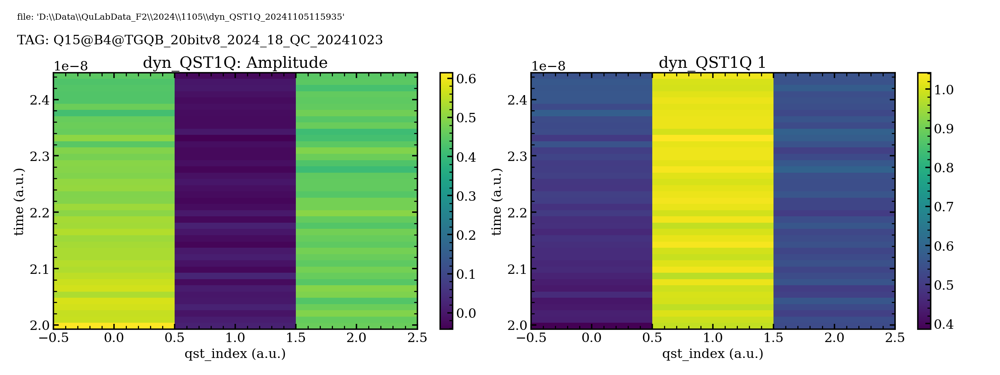

'D:\\Data\\QuLabData_F2\\2024\\1105\\dyn_QST1Q_20241105115935.jpg'


In [18]:
measQ = "Q15"
with cfgContext(cfg_file) as config:
    config[measQ]['gate']['X_1']['pi_amp'] = 0.1
    pi_len = config[measQ]['gate']['X_1']['pi_len']
setting = {
    'shots_avg':False,
    'singleShot_mode': 'svm',
    'populationConvert_mode': 'matrixCali',
#     'populationConvert_mode': None,
        'state_preparation': {
            f'{measQ}': ['X_1',]
        },
}
timeList = np.linspace(pi_len * 0.9, pi_len*1.1 , 41)

experiment = dyn_QST1Q_len(measQ, timeList,tags=None,shots=2000, setting=setting, constrains=None)
rd=await ADC_Executor(experiment)
reset_offset()

'D:\\Data\\QuLabData_F2\\2024\\1105\\QST1Q_20241105113237.qdat'


<IPython.core.display.Javascript object>


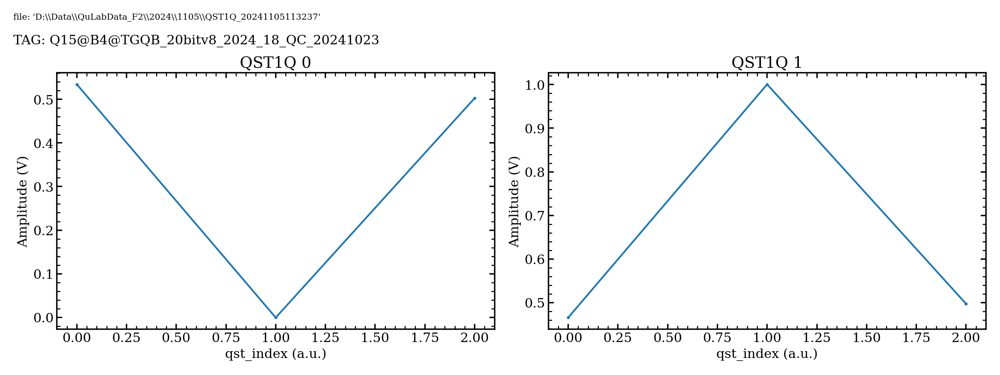

'D:\\Data\\QuLabData_F2\\2024\\1105\\QST1Q_20241105113237.jpg'


In [31]:
measQ='Q15'
reset_offset()
# repeat = 100
with cfgContext(cfg_file) as config:
    config[measQ]['gate']['X_1']['pi_amp'] = 0.1
setting = {
    'shots_avg':False,
    'singleShot_mode': 'svm',
    'populationConvert_mode': 'matrixCali',
#     'populationConvert_mode': None,
        'state_preparation': {
            f'{measQ}': ['X_1',]
        },
}
# for measQ in qubits:
#     experiment = adc.Rabi.TimeRabi(measQ, timeList, tags=None, setting=setting)
#     rd=await ADC_Executor(experiment)
experiment = adc.tomo1q.QST1Q(measQ, tags=None, setting=setting)
rd=await ADC_Executor(experiment)
# rd=await Repeat_Executor(experiment,repeats=repeat)
qst_file = rd.id_list[0]

In [6]:
from calc_tomo import *
import qutip as qt

# file = 'D:\\Data\\QuLabData_F2\\2024\\1105\\QST1Q_20241105113012.qdat'
file = 'E:\桌面\dyn\动态测试\dyn_QST1Q_20241105115812.qdat'
# file = qst_file
qdataA = np.load(file,allow_pickle=True)
# repeat = 
# print(qdataA['data'])
theta_list = []
phi_list = []
dataA = qdataA['data'][-1]
Xlist = []
ylist = []
zlist = []
sigma_x = np.array([[0,1],[1,0]])
sigma_y = np.array([[0,-1j],[1j,0]])
sigma_z = np.array([[1,0],[0,-1]])
for i in range(len(dataA[0])):
    dataB = [dataA[0][i].tolist(),dataA[1][i].tolist(),dataA[2][i].tolist()]
    N = 1
    cal_type="prob"
    qstprob = map_inidata_to_qstprob(N=N, qdataA=qdataA, dataA=dataB, cal_type=cal_type)
    rho_calc = qst_calc(N, qstprob, fit_type=None)
    # print(rho_calc)
    Ug = qt.qip.operations.rx(np.pi/2).full()
    fidelity, rhoi = calc_rho_fidelity(N, rho_calc, Ug)
    # print(fidelity)
    # fig,ax, p = calc_state_prob(rho_calc,plot_control =plt)'
    x = np.trace(np.dot(rho_calc,sigma_x))
    y = np.trace(np.dot(rho_calc,sigma_y))
    z = np.trace(np.dot(rho_calc,sigma_z))
    # print((x,y,z))
print((x,y,z))

((0.1126705653021444+5.551115123125783e-16j), (-1.0389863547758282+8.326672684688674e-17j), (-0.11890838206627707-1.5201861277436657e-16j))


<IPython.core.display.Javascript object>


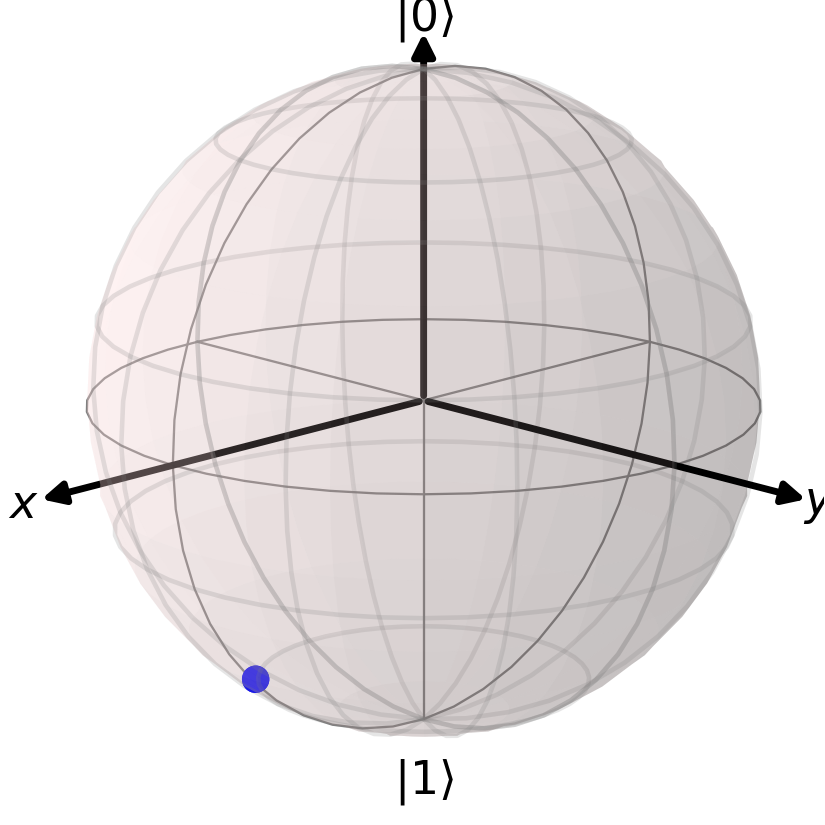

<IPython.core.display.Javascript object>


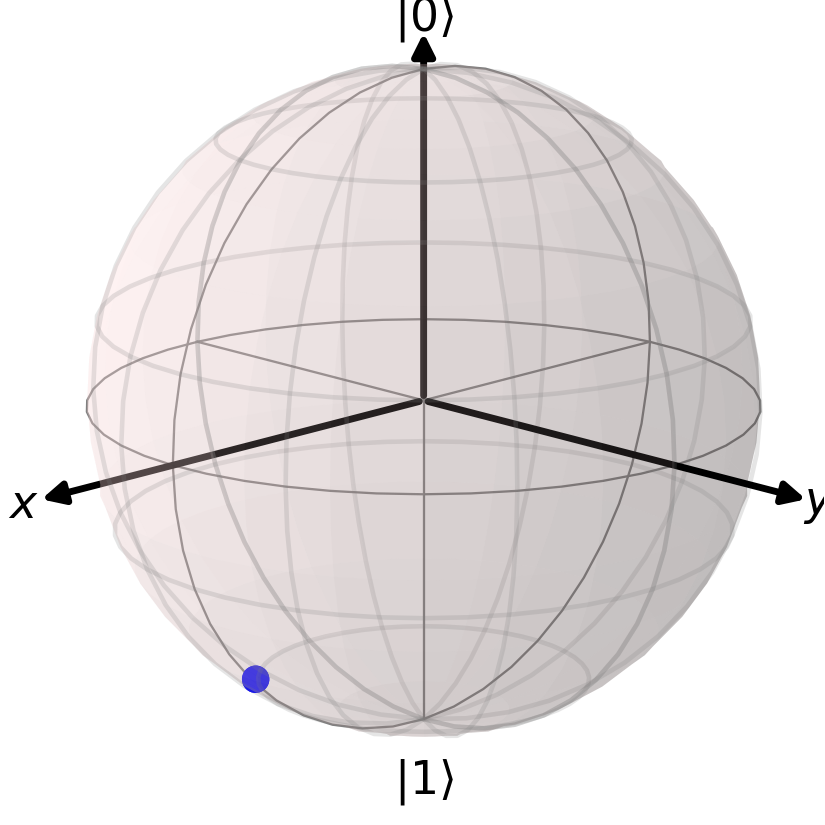

In [59]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
b = qt.Bloch(view=(-45, 15))
b.vector_color = ['k', 'k', 'k']  # 设置向量颜色
b.add_vectors([1.5, 0, 0])  # x 轴
b.add_vectors([0, 1.5, 0])  # y 轴
b.add_vectors([0, 0, 1.12])  # z 轴
b.xlpos = [1.55, -1.55]
b.ylpos = [1.53, -1.53]
b.zlpos = [1.15, -1.2]
b.set_label_convention(convention="original")
# b.add_points([xSY_list,ySY_list,zSZ_list],alpha=0.1)
b.add_points([x,y,z], alpha=1)
# b.add_points([xX_list,yX_list,zX_list],alpha=0.1)
# b.add_points([xX_mean,yX_mean,zX_mean], alpha=1)
# b.point_color = ['#94BB71','g', '#0B4FA9','b', '#F36767','r','#590F4B','#D206E8']
# b.point_size = [2,40,2,40,2,40,2,40]
# b.point_color = ['#94BB71','g']
b.point_size = [120]
b.point_marker = ['o']
# b.plot_points()
# b.point_size = [20]|
# b.size([7,7])
b.show()
# b.save("bloch.png",dpin=720)